<a href="https://colab.research.google.com/github/arvind2047/gl_capstone/blob/temp_repo_siva/GL_AIML_Capstone_Automatic_Ticket_Assignment_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##**Automatic Ticket Assignment - problem statement, objective and steps involved**

# INDEX:

----

####I. Import Libraries
####II. Load and understand the data
####III. Data Cleansing
####IV. Exploratory Data Analysis
>i. Group by category   
>ii. Distribution by group   
>iii. Caller - Assignment group analysis to identify any patterns   
>iv. Short description length analysis and its relation with Assignment group   
>v. Description length analysis and its relation with assignment group   
>vi. Mean length of Description Columns   
>vii. Get the Frequency of Words in the Description Column   
####V. Text Pre-processing   
>i. Get the frequency of words in Description Column   
>ii. Expand the contractions   
>iii. English Language Detection   
>iv. Plot the language Distribution   
>v. Translate non-English details   
>vi. Tokenization   
>vii. Converting all Characters to Lowercase   
>viii. Removing Punctuations   
>ix. Removing Stopwords   
>x. Lemmatization   
>xi. Plot the document frequency of the Description Field   
####VI. Exploratory Data Analysis on pre-processed Data   
>i.Groups with most and least frequent number of tickets   
>ii. Distribution of tickets based on ticket count   
>iii. Derive insights on ticket distribution by L1/L2 and L3 Queues   
>iv. Character and word counts in Short description by L1/L2 and L3   
>v. Number of unique words in each article   
>vi. Word clouds by assignment groups   
>vii. Measure Readability of a ticket
####VII. Topic Modeling    
>i. Count Vectorizer   
>ii. Latent Dirichlet Allocation (LDA)  
>iii. Non-Negative Matrix Factorization (NMF) approach using TF-IDF   
>iv. TF-IDF distribution   
>v. Dimensionality Reduction using t-SNE
####VIII. Agglomerative Clustering   
>i. Get Embeddings from Glove   
>ii. Model Building   
>iii. Classification Models on Glove embedding clusters   
>iv. Classification Models on bag of words   






# Automatic Ticket Assignment





Problem Statement:

Manual assignment of incidents is time consuming and requires human efforts. There may be mistakes due to human errors and resource consumption is carried out ineffectively because of the misaddressing. On the other hand, manual assignment increases the response and resolution times which result in user satisfaction deterioration / poor customer service.

Additional effort needed for Functional teams to re-assign to right functional groups. During this process, some of the incidents are in queue and not addressed timely resulting in poor customer service. Guided by powerful AI techniques that can classify incidents to right functional groups can help organizations to reduce the resolving time of the issue and can focus on more productive tasks.

**Objective:**

The objective of the project is,

Learn how to use different classification models.
Use transfer learning to use pre-built models.
Learn to set the optimizers, loss functions, epochs, learning rate, batch size, checkpointing, early stopping etc.
Read different research papers of given domain to obtain the knowledge of advanced models for the given problem.
This capstone project intends to reduce the manual intervention of IT operations or Service desk teams by automating the ticket assignment process.The goal here is to create a text classification based ML model that can automatically classify any new tickets by analysing ticket description to one of the relevant Assignment groups, which could be later integrated to any ITSM tool like Service Now. Based on the ticket description our model will output the probability of assigning it to one of the 74 Groups.

Data:

Details about the data and dataset files are given in below link, https://drive.google.com/open?id=1OZNJm81JXucV3HmZroMq6qCT2m7ez7IJ

**Steps Involved:**

> **Pre-Processing, Data Visualization and EDA**

*   Exploring the given Data files
*   Understanding the structure of data
*   Missing points in data
*   Finding inconsistencies in the data
*   Visualizing different patterns
*   Visualizing different text features
*   Dealing with missing values
*   Text preprocessing
*   Creating word vocabulary from the corpus of report text data
*   Creating tokens as required

> **Model Building**

*   Building a model architecture which can classify.
*   Trying different model architectures by researching state of the art for similar tasks.
*   Train the model
*   To deal with large training time, save the weights so that you can use them when training the model for the second time without starting from scratch.

> **Test the Model, Fine-tuning and Repeat**

*   Test the model and report as per evaluation metrics
*   Try different models
*   Try different evaluation metrics
*   Set different hyper parameters, by trying different optimizers, loss functions, epochs, learning rate, batch size, checkpointing, early stopping etc..for these models to fine-tune them
*   Report evaluation metrics for these models along with your observation on how changing different hyper parameters leads to change in the final evaluation metric.

## Import Libraries

In [2]:
!pip install tensorflow >> /dev/null
!pip install ktrain==0.18.0 >> /dev/null
!pip install googletrans >> /dev/null
!pip install contractions >> /dev/null
!pip install fasttext >> /dev/null
!pip install langdetect >> /dev/null
!pip install gensim >> /dev/null
!pip install imblearn >> /dev/null
!pip install tensorflow-gpu >> /dev/null
!pip install bs4 >> /dev/null
!pip install pyLDAvis >> /dev/null
!pip install warnings >> /dev/null
!pip install bert-for-tf2 >> /dev/null
!pip install sentencepiece >> /dev/null
!pip install tqdm >> /dev/null
!pip install spacy >> /dev/null
!pip install textstat >> /dev/null
!pip install scikit-learn >>  /dev/null

ERROR: tensorflow-gpu 2.3.0 has requirement tensorboard<3,>=2.3.0, but you'll have tensorboard 2.2.2 which is incompatible.
ERROR: tensorflow-gpu 2.3.0 has requirement tensorflow-estimator<2.4.0,>=2.3.0, but you'll have tensorflow-estimator 2.2.0 which is incompatible.
ERROR: tensorflow 2.2.0 has requirement tensorboard<2.3.0,>=2.2.0, but you'll have tensorboard 2.3.0 which is incompatible.
ERROR: tensorflow 2.2.0 has requirement tensorflow-estimator<2.3.0,>=2.2.0, but you'll have tensorflow-estimator 2.3.0 which is incompatible.
ERROR: Could not find a version that satisfies the requirement warnings (from versions: none)
ERROR: No matching distribution found for warnings


In [3]:
# Basic python computation and visualization
import numpy as np
import pandas as pd
#pd.set_option('display.max_colwidth', None)
import matplotlib.pyplot as plt 
import seaborn as sns
sns.set(style='whitegrid',palette='muted',font_scale=1.2)
HAPPY_COLORS_PALETTE = ["#01BEFE","#FFDD00","#FF7D00","#FF006D","#ADFF02","#8F00FF"]
sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

from pylab import rcParams
rcParams['figure.figsize']=12,8
import scipy
import scipy.stats as st
from statsmodels.stats.proportion import proportions_ztest
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# For handling string
import string
import random
import collections
from collections import Counter
# For performing mathematical operations
import math

# Deep Learning Libraries and models
import tensorflow as tf
import keras 
from keras.preprocessing.text import Tokenizer
from keras.models import Sequential
from keras.layers import Dense
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Input, Dense, Dropout, Embedding, LSTM, Flatten, GRU
from keras.models import Model
from keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import io
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorboard.plugins import projector
import bert
from bert import BertModelLayer
from bert.loader import StockBertConfig, map_stock_config_to_params, load_stock_weights
from bert.tokenization.bert_tokenization import FullTokenizer
import ktrain
from ktrain import text
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Model building

from time import time
from sklearn import preprocessing
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder 
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import confusion_matrix, classification_report, auc, f1_score, precision_score, recall_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from xgboost.sklearn import XGBClassifier
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist
import pickle
plt.style.use('ggplot')
%matplotlib inline

# Tools & Evaluation metrics
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import roc_curve, accuracy_score, precision_recall_curve 
from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import train_test_split, cross_val_score
from imblearn.over_sampling import RandomOverSampler

# NLP text handling libraries
import re
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk import FreqDist
from nltk import pos_tag
from string import punctuation
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import spacy
import googletrans
from googletrans import Translator
from gensim.test.utils import datapath, get_tmpfile
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import contractions
import fasttext
from langdetect import detect
import textstat

# Topic Modeling
import pyLDAvis.sklearn
from textblob import TextBlob
from sklearn.decomposition import LatentDirichletAllocation, NMF
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

# General purpose
import os
from zipfile import ZipFile
from google.colab import drive
from tqdm import tqdm
import datetime

RANDOM_SEED=42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [4]:
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [5]:
project_path = '/content/drive/My Drive/GL AIML Capstone/' 
os.chdir(project_path) 
os.getcwd()

'/content/drive/My Drive/GL AIML Capstone'

## Load and Understand the Data

In [ ]:
## Read the data from EXCEL
incidents = pd.read_excel(project_path + "input_data.xlsx")

## Quick View 
incidents.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [ ]:
## basic info
incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [ ]:
## Shape
incidents.shape

(8500, 4)

In [ ]:
## List of columns
incidents.columns

Index(['Short description', 'Description', 'Caller', 'Assignment group'], dtype='object')

In [ ]:
## List the unique assignment groups
incidents["Assignment group"].unique()
print("Number of unique assignment groups - ", incidents["Assignment group"].nunique())

Number of unique assignment groups -  74


In [ ]:
## find nulls
incidents[incidents.isna().any(axis=1)]

,Short description,Description,Caller,Assignment group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


**Observation:**

* There are 4 columns and all are string columns.
* There are totally 8500 rows and there seems to be missing values in Short description and Description columns, which needs to be looked into and handled.
* There are 74 unique assignment groups - GRP_0 the most frequent item with 3976 entries.
* Caller columns mainly contains the details of the user who raised the incident and is of not much use in our analysis and can be dropped.
* Assignment group is our predictor / target column with multiple classes.
This is a Multiclass Classification problem.


## Data Cleansing
Following actions were peformed - 
* Remove null columns
* Drop duplicates
* Remove special characters, trailing spaces, numbers
* Convert to lower case

In [ ]:
# drop nulls
incidents.dropna(inplace=True)
incidents.shape

(8491, 4)

In [ ]:
incidents.columns

Index(['Short description', 'Description', 'Caller', 'Assignment group'], dtype='object')

In [ ]:
## Duplicates 
incidents[incidents.duplicated()]

,Short description,Description,Caller,Assignment group
51,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,olckhmvx pcqobjnd,GRP_0
229,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,olckhmvx pcqobjnd,GRP_0
493,ticket update on inplant_872730,ticket update on inplant_872730,fumkcsji sarmtlhy,GRP_0
512,blank call //gso,blank call //gso,rbozivdq gmlhrtvp,GRP_0
667,job bkbackup_tool_powder_prod_full failed in j...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
...,...,...,...,...
7836,probleme mit erpgui \tmqfjard qzhgdoua,probleme mit erpgui \tmqfjard qzhgdoua,tmqfjard qzhgdoua,GRP_24
8051,issue on pricing in distributor_tool,we have agreed price with many of the distribu...,hbmwlprq ilfvyodx,GRP_21
8093,reset passwords for prgthyuulla ramdntythanjes...,the,boirqctx bkijgqry,GRP_17
8347,blank call // loud noise,blank call // loud noise,rbozivdq gmlhrtvp,GRP_0


In [ ]:
# Remove Duplicates
incidents = incidents.drop_duplicates(['Short description', 'Description', 'Caller', 'Assignment group'])

In [ ]:
#remove spaces trailing
incidents['Short description'] = incidents['Short description'].str.strip()
incidents['Description'] = incidents['Description'].str.strip()

#remove tabs and carriage returns
incidents.replace(to_replace=[r"\\t|\\n|\\r", "\t|\n|\r"], value=[" "," "], regex=True, inplace=True)

# Removing special characters
incidents['Short description']  = incidents['Short description'].map(lambda x: re.sub(r'\W', ' ', x))
incidents['Description'] = incidents['Description'].map(lambda x: re.sub(r'\W', ' ', x))

#Getting rid of numbers & special characters etc

spec_chars = ["!",'"',"#","%","&","'","(",")",
              "*","+",",","-",".","/",":",";","<",
              "=",">","?","@","[","\\","]","^","_",
              "`","{","|","}","~","–"]
for char in spec_chars:
    incidents['Short description'] = incidents['Description'].str.replace(char, ' ')
    incidents['Description'] = incidents['Description'].str.replace(char, ' ')

#remove numbers    
incidents['Description'] = incidents['Description'].replace('\d+', '', regex=True)
incidents['Short description'] = incidents['Short description'].replace('\d+', '', regex=True)
    
#remove more than 1 space
incidents.replace('\s+', ' ', regex=True, inplace=True)

#make lower case
incidents.apply(lambda x: x.astype(str).str.lower())

incidents.head(10)

<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence 

,Short description,Description,Caller,Assignment group
0,verified user details employee manager name c...,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0
1,received from hmjdrvpb komuaywn gmail com hell...,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0
2,received from eylqgodm ybqkwiam gmail com hi i...,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0
6,event critical HostName company com the value ...,event critical HostName company com the value ...,jyoqwxhz clhxsoqy,GRP_1
7,ticket no employment status new non employee e...,ticket no employment status new non employee e...,eqzibjhw ymebpoih,GRP_0
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0
9,ticket update on inplant,ticket update on inplant,fumkcsji sarmtlhy,GRP_0


## Exploratory Data Analysis

### Group by Category

In [ ]:
## Group by Categories
df_grp = incidents.groupby(['Assignment group']).size().reset_index(name='counts')
df_grp

,Assignment group,counts
0,GRP_0,3926
1,GRP_1,31
2,GRP_10,140
3,GRP_11,30
4,GRP_12,257
...,...,...
69,GRP_71,2
70,GRP_72,2
71,GRP_73,1
72,GRP_8,645


In [ ]:
df_grp.describe()

,counts
count,74.000000
mean,113.621622
std,459.823990
min,1.000000
25%,5.250000
50%,26.000000
75%,81.000000
max,3926.000000


### Distribution by group

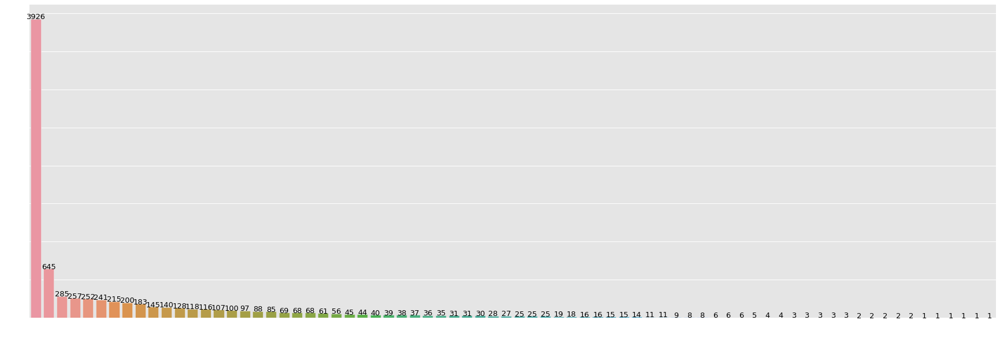

In [ ]:
assgn = incidents['Assignment group'].value_counts()
plt.figure(figsize=(30,10))
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'
cntplot = sns.barplot(x=assgn.index,y=assgn.values)
cntplot.set_xticklabels(cntplot.get_xticklabels(), rotation=90, ha="right")
for i in range(len(assgn)):
  cntplot.text(i, assgn.values[i], assgn.values[i], color='black', ha='center', fontsize=13)
plt.show()

**Observation:**

* The Target class distrubtion is extremely skewed
* Large no of entries for GRP_0 (amounting to 3926) which account for ~50% of the data
* GRP_0 and GRP_8 together amount to around 55% of the available data.
* There are groups with 1 entry also. 
* We have to resolve the imbalance before modelling.

### Caller - Assignment group analysis to identify any patterns

In [ ]:
incidents['Caller'].describe()

count                  8408
unique                 2948
top       bpctwhsn kzqsbmtp
freq                    788
Name: Caller, dtype: object

**Observation:**
*   There are 2948 unique callers who have submitted tickets.
*   'bpctwhsn kzqsbmtp' is the most frequent caller with 788 records  

Let us try to explore any relation between the caller and assignment groups.

In [ ]:
incidents_freqgrp = incidents[incidents['Assignment group'].isin(list(incidents['Assignment group'].value_counts()[incidents['Assignment group'].value_counts()>10].index))]
freq_grp = (np.max(pd.crosstab(incidents_freqgrp['Caller'],incidents_freqgrp['Assignment group'])) /
            np.sum(pd.crosstab(incidents_freqgrp['Caller'],incidents_freqgrp['Assignment group']))).sort_values(ascending=False)
grp_df = incidents_freqgrp[incidents_freqgrp['Assignment group'].isin(list(freq_grp[freq_grp>0.4].index))].groupby(by='Assignment group').agg(lambda x:x.value_counts().index[0])
grp_df.loc[freq_grp[freq_grp>0.4].index,'Percentage tickets by most frequent caller'] = freq_grp[freq_grp>0.4].round(3).values
grp_df.loc[freq_grp[freq_grp>0.4].index,'Total records for group'] = incidents[incidents['Assignment group'].isin(list(freq_grp[freq_grp>0.4].index))]['Assignment group'].value_counts()
grp_df.drop(columns=['Short description','Description'])

,Caller,Percentage tickets by most frequent caller,Total records for group
Assignment group,,,
GRP_10,bpctwhsn kzqsbmtp,0.429,140
GRP_41,entuakhp xrnhtdmk,0.550,40
GRP_5,bpctwhsn kzqsbmtp,0.742,128
GRP_6,bpctwhsn kzqsbmtp,0.481,183
GRP_60,bpctwhsn kzqsbmtp,0.750,16
GRP_8,bpctwhsn kzqsbmtp,0.536,645
GRP_9,bpctwhsn kzqsbmtp,0.607,252


**Observation:**

* We have listed the assignment groups where most of the records are submitted by 
single caller.
* 'bpctwhsn kzqsbmtp' is the most frequent caller for groups 5, 6, 8, 9, 10 and 60. 
* There is some correlation between these groups and caller names, but this is not significant enough finding to set as a rule.








In [ ]:
incidents_freqcall = incidents[incidents['Caller'].isin(list(incidents['Caller'].value_counts()[incidents['Caller'].value_counts()>20].index))]
freq_call = (np.max(pd.crosstab(incidents_freqcall['Assignment group'],incidents_freqcall['Caller'])) /
            np.sum(pd.crosstab(incidents_freqcall['Assignment group'],incidents_freqcall['Caller']))).sort_values(ascending=False)
call_df = incidents_freqcall[incidents_freqcall['Caller'].isin(list(freq_call[freq_call>0.7].index))].groupby(by='Caller').agg(lambda x:x.value_counts().index[0])
call_df.loc[freq_call[freq_call>0.7].index,'Percentage tickets by most frequent group'] = freq_call[freq_call>0.7].round(3).values
call_df.loc[freq_call[freq_call>0.7].index,'Total records for caller'] = incidents[incidents['Caller'].isin(list(freq_call[freq_call>0.7].index))]['Caller'].value_counts()
call_df.drop(columns=['Short description','Description'])

,Assignment group,Percentage tickets by most frequent group,Total records for caller
Caller,,,
efbwiadp dicafxhv,GRP_0,1.000,45
entuakhp xrnhtdmk,GRP_41,0.880,25
fumkcsji sarmtlhy,GRP_0,0.984,128
jionmpsf wnkpzcmv,GRP_24,0.958,24
olckhmvx pcqobjnd,GRP_0,1.000,47
rbozivdq gmlhrtvp,GRP_0,0.986,72


**Observation:**

*   We have plotted the caller based analysis where most of the records submitted by the caller are to a single group.
* All the records from callers 'efbwiadp dicafxhv' and 'olckhmvx pcqobjnd' are assigned to group 0. Again, we can't consider this significant because group 0 records account for half of all input data.
* Consider the volume of total records, we conclude there is no significant correlation between caller and assignment group.



### Short description length analysis and its relation with Assignment group

In [ ]:
incidents['sdesc_len'] = incidents['Short description'].str.len()

Text(0.5, 1.0, 'Distribution of length of short descriptions')

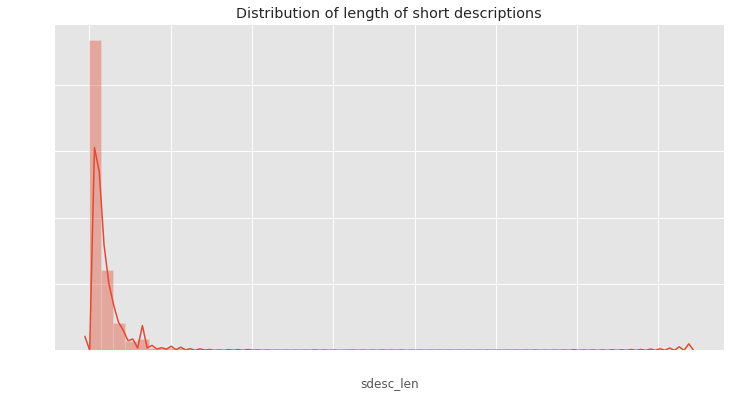

In [ ]:
plt.figure(figsize=(12,6))
sns.distplot(incidents['sdesc_len']).set_title('Distribution of length of short descriptions')

**Observation:**

Above plot shows the distribution of short description lengths.
We observe two peaks - most of the records are 20-30 words long but there is also a peak around 60. There is a possibility that this peak maybe characteristic of particular groups. Let us look at the groupwise analysis.

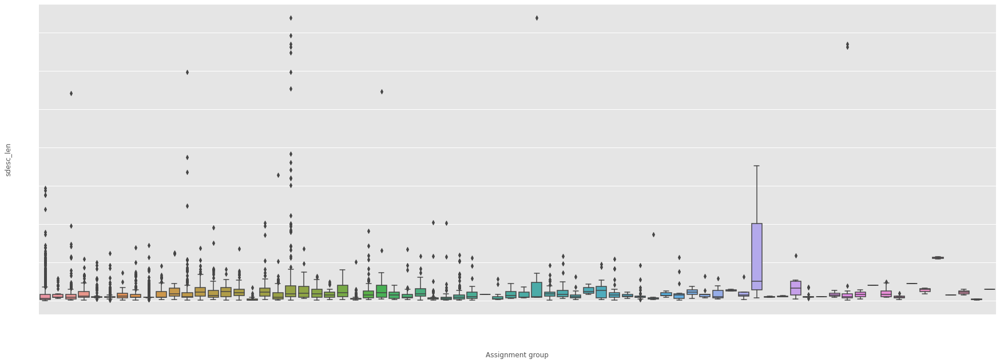

In [ ]:
plt.figure(figsize=(30,10))
lengths = sns.boxplot(data=incidents, x='Assignment group', y='sdesc_len')
lengths.set_xticklabels(lengths.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

We can see most of the short description are around 30 to 80 characters long with mean length around 50. However, we can see data for certain groups are on the upper range (GRP_20, GRP_1, GRP_56), while some have a characteristic to have lower lengths (GRP_0, GRP_48, GRP_19).

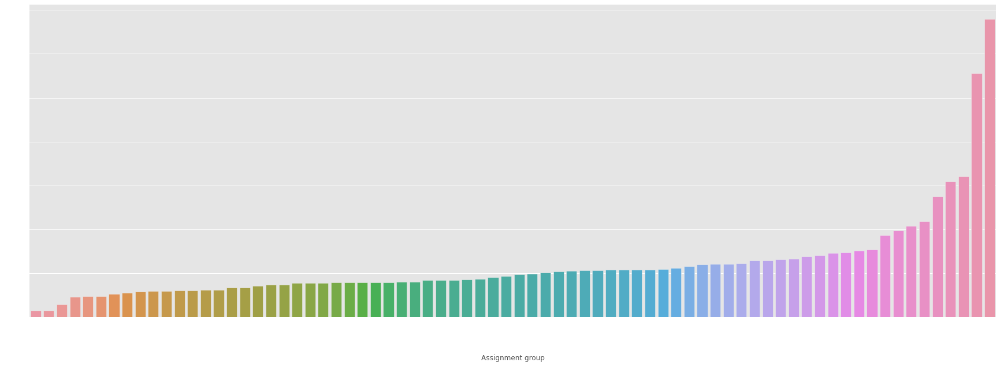

In [ ]:
plt.figure(figsize=(30,10))
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'
plot_meansdesc_len=sns.barplot(x=incidents.groupby(['Assignment group']).mean()['sdesc_len'].sort_values().index,
                               y=incidents.groupby(['Assignment group']).mean()['sdesc_len'].sort_values().values)
plot_meansdesc_len.set_xticklabels(plot_meansdesc_len.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

We are seeing a pattern with records for groups 17, 57 and 61 typically having longer mean word lengths in contrast to most other groups having lengths below 60 words.


### Description length analysis and its relation with assignment group

In [ ]:
incidents['desc_len'] = incidents['Description'].str.len()

Text(0.5, 1.0, 'Distribution of length of descriptions')

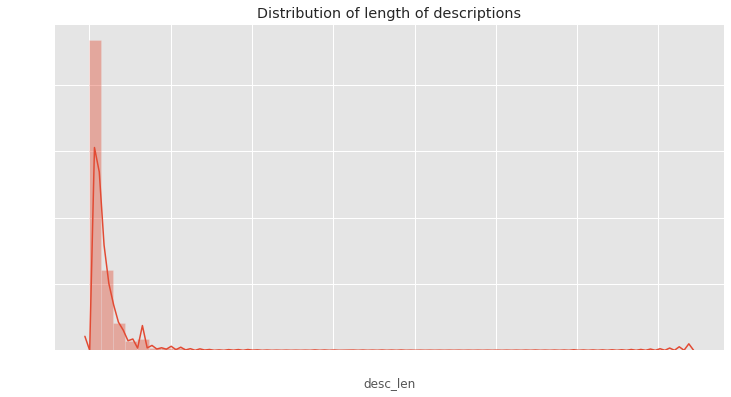

In [ ]:
plt.figure(figsize=(12,6))
sns.distplot(incidents['desc_len']).set_title('Distribution of length of descriptions')

**Observation:**

The distribution of description lengths is extremely skewed, let us try to omit the tail and focus the major portion from the right skewed graph.

In [ ]:
incidents['desc_len'].describe(percentiles=[0.25,0.5,0.75,0.9,0.95])

count    8408.000000
mean      167.200404
std       344.296363
min         0.000000
25%        39.000000
50%        81.000000
75%       184.000000
90%       353.300000
95%       587.250000
max      7376.000000
Name: desc_len, dtype: float64

In [ ]:
len(incidents[incidents['desc_len'] > 680])

230

**Observation:**

* Half of the records have less than 100 words.
* 90% of descriptions have less than 400 words.
* The remaining 10% records are very long and extremely skewed in comparison with the remaining portion.

Let us consider till the 95th percentile for further visualization.

Text(0.5, 1.0, 'Distribution of length of descriptions')

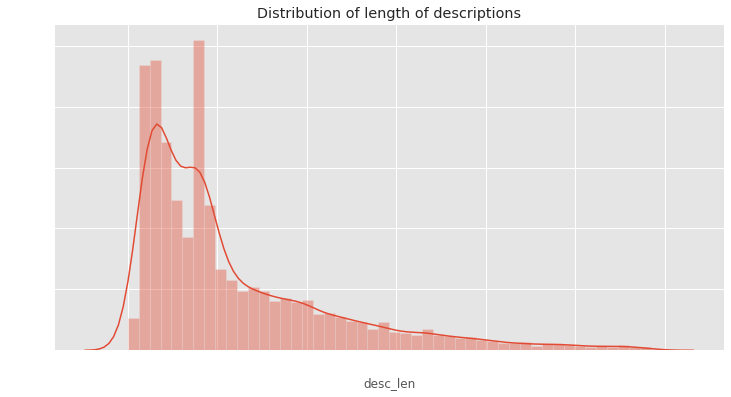

In [ ]:
incidents_95 = incidents[incidents['desc_len'] < incidents['desc_len'].quantile(0.95)]
plt.figure(figsize=(12,6))
sns.distplot(incidents_95['desc_len']).set_title('Distribution of length of descriptions')

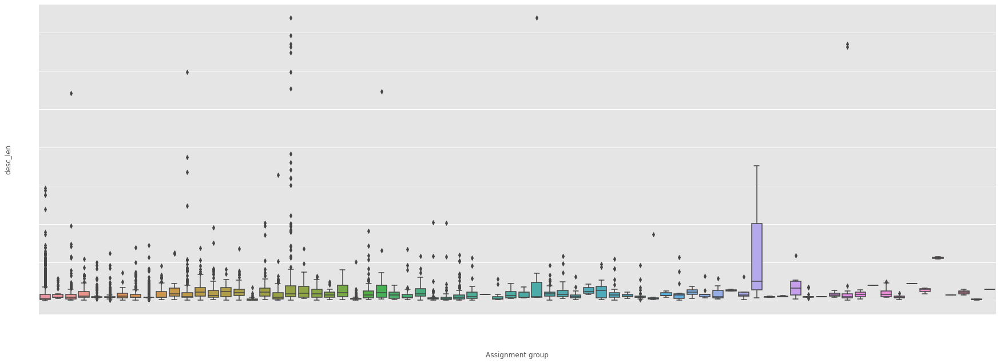

In [ ]:
plt.figure(figsize=(30,10))
lengths = sns.boxplot(data=incidents, x='Assignment group', y='desc_len')
lengths.set_xticklabels(lengths.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

From the above graph, most of the group 56 records have long descriptions.
Let us bring the focus to records which have limited length. 


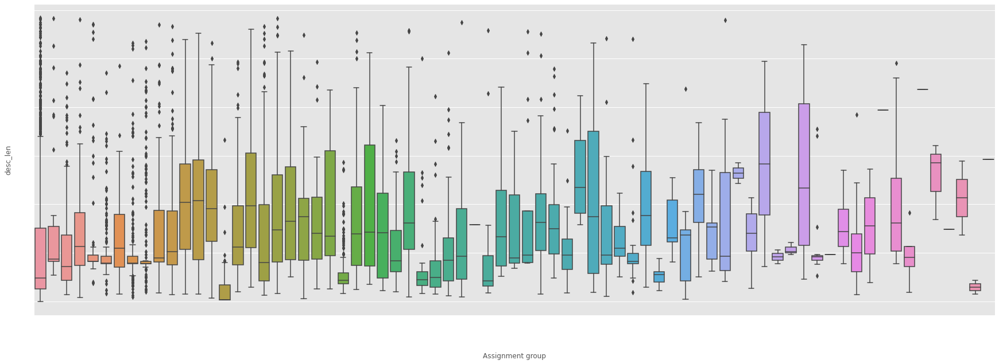

In [ ]:
plt.figure(figsize=(30,10))
lengths = sns.boxplot(data=incidents_95, x='Assignment group', y='desc_len')
lengths.set_xticklabels(lengths.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

There is no clear pattern visible to describe the relation between group and description lengths. It is however visible that for most of the groups, there are less outliers and some groups fall in the lower range while most of them have lengths in the range of 100 to 350.

### Mean length of Description Columns

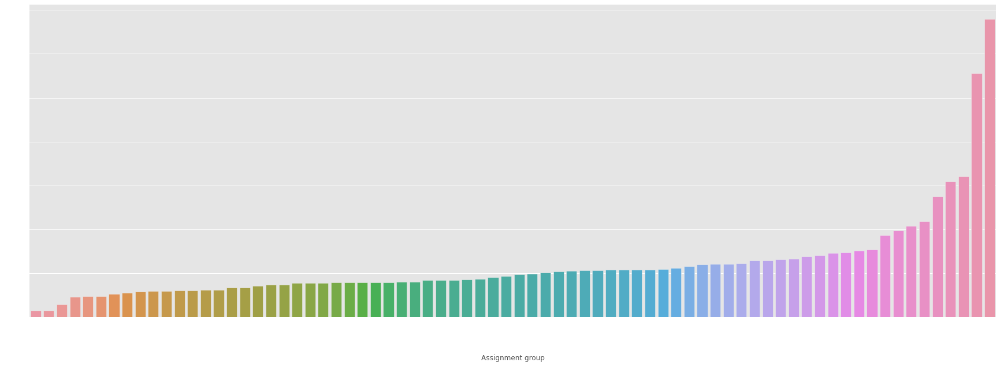

In [ ]:
plt.figure(figsize=(30,10))
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'
plot_meandesc_len=sns.barplot(x=incidents.groupby(['Assignment group']).mean()['desc_len'].sort_values().index,
                               y=incidents.groupby(['Assignment group']).mean()['desc_len'].sort_values().values)
plot_meandesc_len.set_xticklabels(plot_meandesc_len.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

There is a clear distinction between the data of five groups which have very long description data. Other group records have mean length lesser than 500 words.

In [ ]:
#Check if short description is present in Description field, else merge both the fields into Description field
incidents['isSubstr'] = incidents.apply(lambda x: x['Short description'] not in x['Description'], axis=1)
incidents.loc[incidents['isSubstr']==True, 'Description'] = incidents['Short description'] + ' ' + incidents['Description']

In [ ]:
incidents.drop(columns=['Short description','sdesc_len','desc_len','isSubstr'],inplace=True)
incidents.head()

,Description,Caller,Assignment group
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,owlgqjme qhcozdfx,GRP_0


### Get the Frequency of Words in the Description Column

---



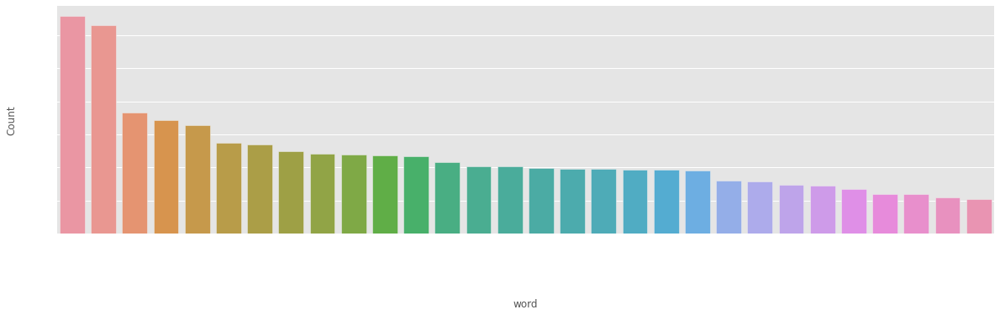

In [ ]:
def freq_words(x, terms = 30):
  all_words = ' '.join([text for text in x])
  all_words = all_words.split()

  fdist = FreqDist(all_words)
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})

  # selecting top n most frequent words
  d = words_df.nlargest(columns="count", n = terms) 
  plt.figure(figsize=(20,5))
  plt.rcParams['xtick.color'] = 'white'
  plt.rcParams['ytick.color'] = 'white'
  ax = sns.barplot(data=d, x= "word", y = "count")
  ax.set(ylabel = 'Count')
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
  plt.show()

freq_words(list(incidents['Description']))

#### Generate a wordcloud for the Description column 

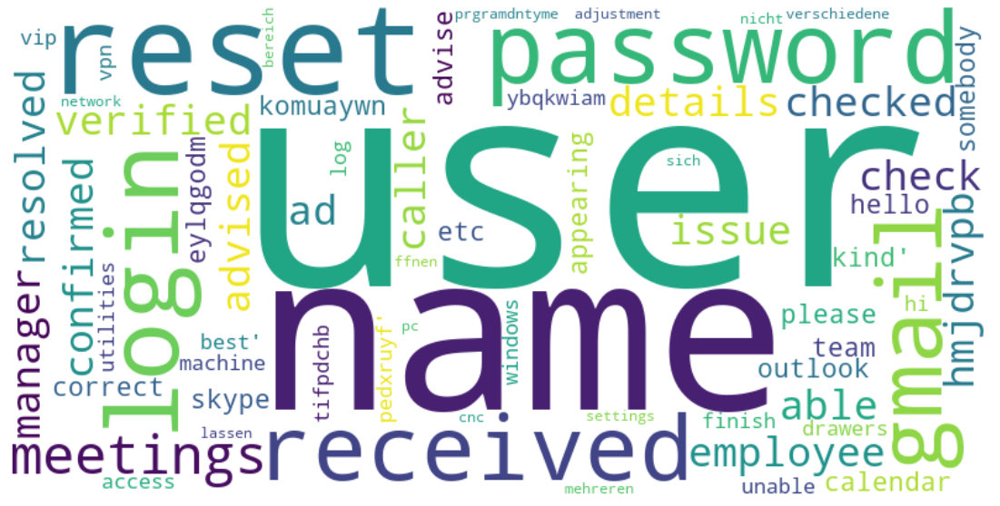

In [ ]:
#word cloud for overall data
stopwords = STOPWORDS

wordcloud = WordCloud(stopwords = stopwords, max_words=500, background_color="white",width=800, height=400).generate(str(incidents['Description'].values))

plt.figure( figsize=(20,10) )
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()

**Observation:** 

The word cloud shows the top reasons for raising a ticket but it needs to be pre-processed so that we can identify any patterns.

## Text Pre-processing

#### Get the frequency of words in Description Column

In [ ]:
# function to plot most frequent terms. This is used to gauge the quality of text processing
def freq_words(x, terms = 30):
  all_words = ' '.join([text for text in x])
  all_words = all_words.split()

  fdist = FreqDist(all_words)
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})

  # selecting top n most frequent words
  d = words_df.nlargest(columns="count", n = terms) 
  plt.figure(figsize=(20,5))
  ax = sns.barplot(data=d, x= "word", y = "count")
  ax.set(ylabel = 'Count')
  plt.show()

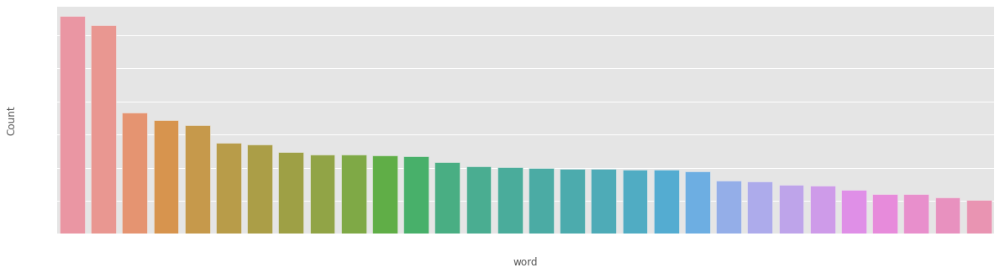

In [ ]:
freq_words(list(incidents['Description']))

**Observation:**

The above plot shows most frequent words in the dataset.
We can see that most of the words are common English words (known as 'stopwords') and doesn't contribute to any inference. We can only try to do inference after we remove stopwords.

#### Expand the contractions

In [ ]:
incidents['Description_Expanded'] = incidents['Description'].apply(lambda x: [contractions.fix(word) for word in x.split()])

#Convert the expanded column to string
incidents['Description_Expanded_Str'] = [' '.join(map(str, l)) for l in incidents['Description_Expanded']]
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error


#### English Language Detection

In [ ]:
pretrained_model = project_path + "lid.176.bin" 
model = fasttext.load_model(pretrained_model)
langs = []
for sent in incidents['Description_Expanded_Str']:
    lang = model.predict(sent)[0]
    langs.append(str(lang)[11:13])
incidents['langs'] = langs

incidents.head(10)

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja
5,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,"[unable, to, log, in, to, engineering, tool, a...",unable to log in to engineering tool and skype,en
6,event critical HostName company com the value ...,jyoqwxhz clhxsoqy,GRP_1,"[event, critical, HostName, company, com, the,...",event critical HostName company com the value ...,en
7,ticket no employment status new non employee e...,eqzibjhw ymebpoih,GRP_0,"[ticket, no, employment, status, new, non, emp...",ticket no employment status new non employee e...,en
8,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0,"[unable, to, disable, add, ins, on, outlook]",unable to disable add ins on outlook,en
9,ticket update on inplant,fumkcsji sarmtlhy,GRP_0,"[ticket, update, on, inplant]",ticket update on inplant,en


#### Plot the language Distribution

In [ ]:
#checking detected languages
x=incidents['langs'].value_counts()

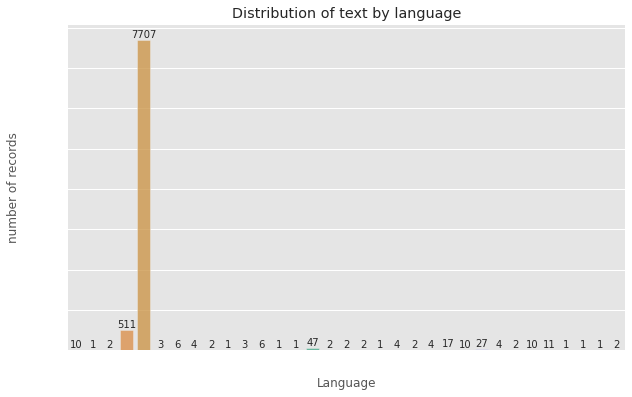

In [ ]:
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Distribution of text by language")
plt.ylabel('number of records')
plt.xlabel('Language')
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show();

**Observation:**

The plot shows that there is sizeable amount of German (de) text in many records (~500) apart from English. It is of importance to gain knowledge from this records so we will proceed with translate.

#### Translate non-English details

In [ ]:
translator = Translator()

desc_trans=[]

for sentence in incidents['Description_Expanded_Str']:
  try:
    language = translator.translate(sentence).src
    trans = translator.translate(sentence).text if language != 'en' else sentence
  except:
    language = "error"
    print("This row throws an error:", sentence)
  desc_trans.append(trans)

incidents['Translated_Description']=desc_trans
incidents.head()


,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error


#### Tokenization

In [ ]:
incidents['tokenized'] = incidents['Translated_Description'].apply(word_tokenize)
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description,tokenized
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...,"[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...,"[received, from, hmjdrvpb, komuaywn, gmail, co..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...,"[received, from, eylqgodm, ybqkwiam, gmail, co..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page,"[unable, to, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error,"[skype, error]"


#### Converting all Characters to Lowercase

In [ ]:
incidents['lower'] = incidents['tokenized'].apply(lambda x: [word.lower() for word in x])
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description,tokenized,lower
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error,"[skype, error]","[skype, error]"


#### Removing Punctuations

In [ ]:
punc = string.punctuation
incidents['no_punc'] = incidents['lower'].apply(lambda x: [word for word in x if word not in punc])
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description,tokenized,lower,no_punc
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error,"[skype, error]","[skype, error]","[skype, error]"


#### Removing Stopwords

In [ ]:
stop_words = set(stopwords.words('english'))
incidents['stopwords_removed'] = incidents['no_punc'].apply(lambda x: [word for word in x if word not in stop_words])
incidents.head()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description,tokenized,lower,no_punc,stopwords_removed
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, hmjdrvpb, komuaywn, gmail, com, hel..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, eylqgodm, ybqkwiam, gmail, com, hi,..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error,"[skype, error]","[skype, error]","[skype, error]","[skype, error]"


#### Lemmatization

The idea of stemming is to reduce different forms of word usage into its root word. For example, “drive”, “drove”, “driving”, “driven”, “driver” are derivatives of the word “drive” and very often researchers want to remove this variability from their corpus. Compared to lemmatization, stemming is certainly the less complicated method but it often does not produce a dictionary-specific morphological root of the word. In other words, stemming the word “pies” will often produce a root of “pi” whereas lemmatization will find the morphological root of “pie”.
Instead of taking the easy way out with stemming, let’s apply lemmatization to our data but it requires some additional steps compared to stemming.
1. First, we have to apply parts of speech tags, in other words, determine the part of speech (ie. noun, verb, adverb, etc.) for each word. 
2. We will use spacy's library to convert the words to their lemma.

In [ ]:
nlp = spacy.load('en', disable=['parser', 'ner'])
allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']
def lemmatize_text(text):
    doc = nlp(text)
    return ' '.join([token.lemma_ for token in doc])

incidents['lemma_str'] = [' '.join(map(str,l)) for l in incidents['stopwords_removed']]
incidents['lemma_str'] = incidents['lemma_str'].apply(lemmatize_text)

##### Create 2 new attributes - length and word count of the lemmatized description field

In [ ]:
incidents['desc_len'] = incidents['lemma_str'].astype(str).apply(len)
incidents['desc_word_cnt'] = incidents['lemma_str'].apply(lambda x: len(str(x).split()))

incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,Translated_Description,tokenized,lower,no_punc,stopwords_removed,lemma_str,desc_len,desc_word_cnt
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,verified user details employee manager name ch...,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...",verify user detail employee manager name check...,138,22
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,received from hmjdrvpb komuaywn gmail com hell...,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, hmjdrvpb, komuaywn, gmail, com, hel...",receive hmjdrvpb komuaywn gmail com hello team...,132,19
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,received from eylqgodm ybqkwiam gmail com hi i...,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, eylqgodm, ybqkwiam, gmail, com, hi,...",receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,unable to access hr tool page,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, access, hr, tool, page]",unable access hr tool page,26,5
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,skype error,"[skype, error]","[skype, error]","[skype, error]","[skype, error]",skype error,11,2


### Plot the document frequency of the Description Field

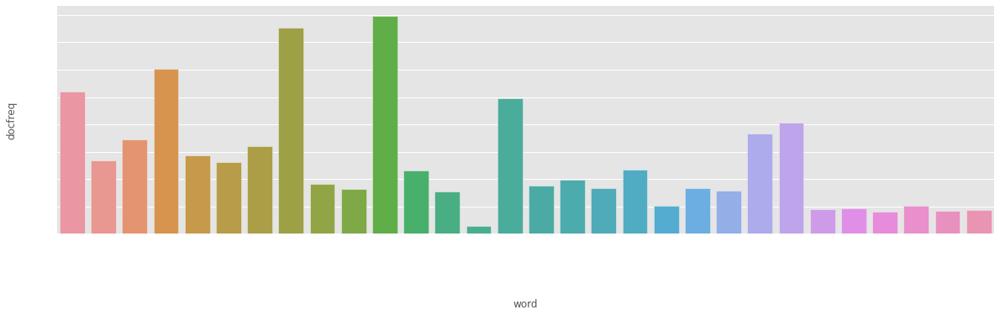

In [ ]:
def docfreq_words(x, terms = 30):
  all_words = ' '.join([text for text in x])
  all_words = all_words.split()

  fdist = FreqDist(all_words)
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})
  
  d = words_df.nlargest(columns="count", n = terms)
  d['docfreq'] = [incidents.Description.str.contains(i).sum() for i in d['word']]
  plt.figure(figsize=(20,5))
  plt.rcParams['xtick.color'] = 'white'
  plt.rcParams['ytick.color'] = 'white'
  ax = sns.barplot(data=d, x= "word", y = "docfreq")
  ax.set(ylabel = 'docfreq')
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
  plt.show()


docfreq_words(list(incidents['Description']))

**Observation:**

The motive behind plotting the frequency of words is to check whether they add value to our prediction data. None of the words have a document frequency that qualify it to be omitted as a stop word from the dataset, so we will proceed further.

## Exploratory Data Analysis on pre-processed Data

In [ ]:
incidents.rename(columns = {'lemma_str':'tokens'}, inplace = True)
incidents.drop(columns=['Description_Expanded','Description_Expanded_Str','langs','Translated_Description','tokenized','lower','no_punc','stopwords_removed'],inplace=True)
incidents.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138,22
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132,19
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26,5
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11,2


In [ ]:
df_inc = incidents['Assignment group'].value_counts().reset_index()
df_inc['percentage'] = (df_inc['Assignment group']/df_inc['Assignment group'].sum())*100
df_inc.head()

,index,Assignment group,percentage
0,GRP_0,3926,46.693625
1,GRP_8,645,7.671265
2,GRP_24,285,3.389629
3,GRP_12,257,3.056613
4,GRP_9,252,2.997146


##### Lets visualize the percentage of incidents per assignment group

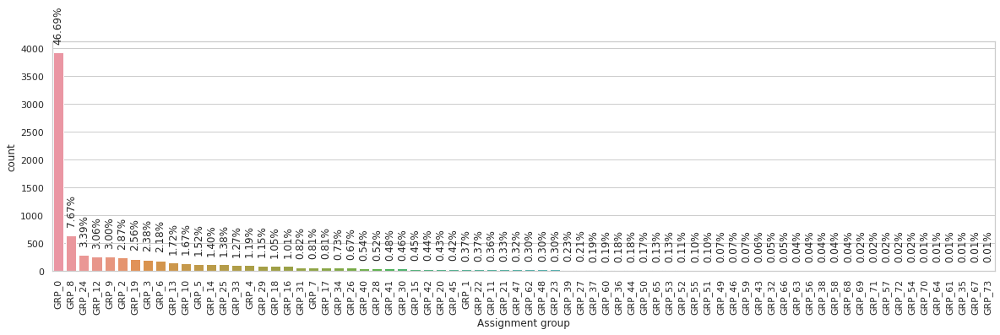

In [ ]:
# Plot to visualize the percentage data distribution across different groups
sns.set(style="whitegrid")
plt.figure(figsize=(20,5))
ax = sns.countplot(x="Assignment group", data=incidents, order=incidents["Assignment group"].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
  ax.annotate(str(format(p.get_height()/len(incidents.index)*100, '.2f')+"%"), (p.get_x() + p.get_width() / 2., p.get_height()), \
              ha = 'center', va = 'bottom', rotation=90, xytext = (0, 10), textcoords = 'offset points')

**Observation:**

Around three quarters of groups don't even contribute 1% each to the data. This imbalance need to be resolved by detailed data analysis.

##### Lets view the top 20 Assignment groups with highest number of tickets

In [ ]:
df_top_20 = incidents['Assignment group'].value_counts().nlargest(20).reset_index()
df_top_20

,index,Assignment group
0,GRP_0,3926
1,GRP_8,645
2,GRP_24,285
3,GRP_12,257
4,GRP_9,252
5,GRP_2,241
6,GRP_19,215
7,GRP_3,200
8,GRP_6,183
9,GRP_13,145


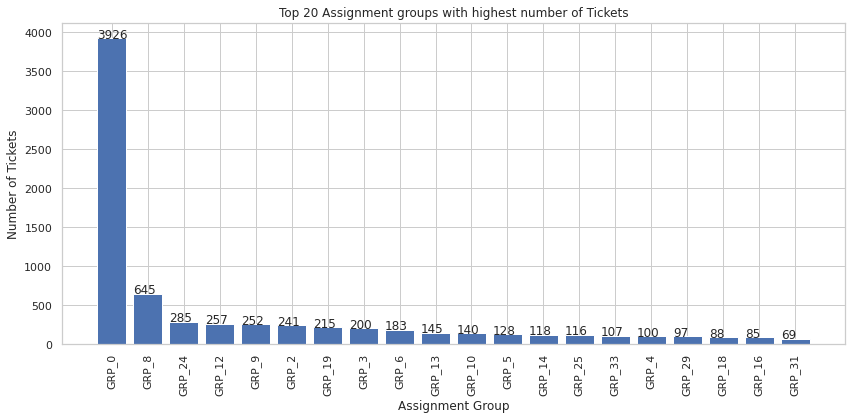

In [ ]:
plt.figure(figsize=(12,6))
bars = plt.bar(df_top_20['index'],df_top_20['Assignment group'])
plt.title('Top 20 Assignment groups with highest number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

##### Lets view the bottom 20 Assignment groups with less number of tickets

In [ ]:
df_bottom_20 = incidents['Assignment group'].value_counts().nsmallest(20).reset_index()
df_bottom_20

,index,Assignment group
0,GRP_70,1
1,GRP_64,1
2,GRP_61,1
3,GRP_35,1
4,GRP_67,1
5,GRP_73,1
6,GRP_69,2
7,GRP_71,2
8,GRP_57,2
9,GRP_72,2


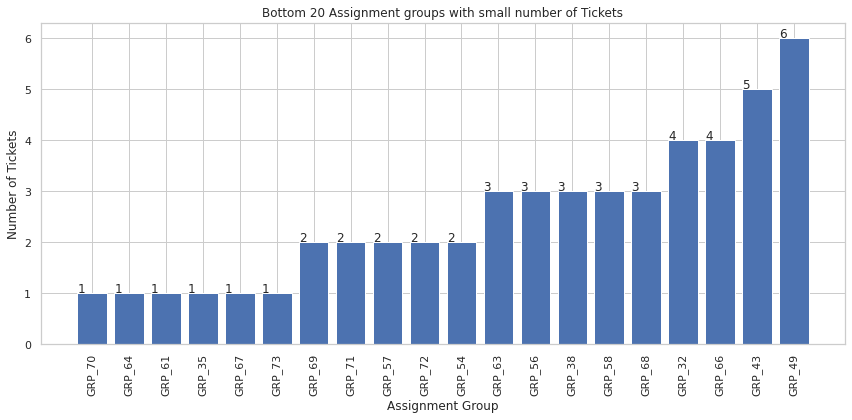

In [ ]:
plt.figure(figsize=(12,6))
bars = plt.bar(df_bottom_20['index'],df_bottom_20['Assignment group'])
plt.title('Bottom 20 Assignment groups with small number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

##### Distribution of tickets based on ticket count

In [ ]:
df_bins = pd.DataFrame(columns=['Description','Ticket Count'])
one_ticket = {'Description':'1 ticket','Ticket Count':len(df_inc[df_inc['Assignment group'] < 2])}
_2_5_ticket = {'Description':'2-5 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 1)& (df_inc['Assignment group'] < 6) ])}
_10_ticket = {'Description':' 6-10 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 5)& (df_inc['Assignment group'] < 11)])}
_10_20_ticket = {'Description':' 11-20 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 10)& (df_inc['Assignment group'] < 21)])}
_20_50_ticket = {'Description':' 21-50 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 20)& (df_inc['Assignment group'] < 51)])}
_51_100_ticket = {'Description':' 51-100 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 50)& (df_inc['Assignment group'] < 101)])}
_100_ticket = {'Description':' >100 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 100)])}
#append row to the dataframe
df_bins = df_bins.append([one_ticket,_2_5_ticket,_10_ticket,
                          _10_20_ticket,_20_50_ticket,_51_100_ticket,_100_ticket], ignore_index=True)

df_bins

,Description,Ticket Count
0,1 ticket,6
1,2-5 ticket,13
2,6-10 ticket,6
3,11-20 ticket,9
4,21-50 ticket,16
5,51-100 ticket,9
6,>100 ticket,15


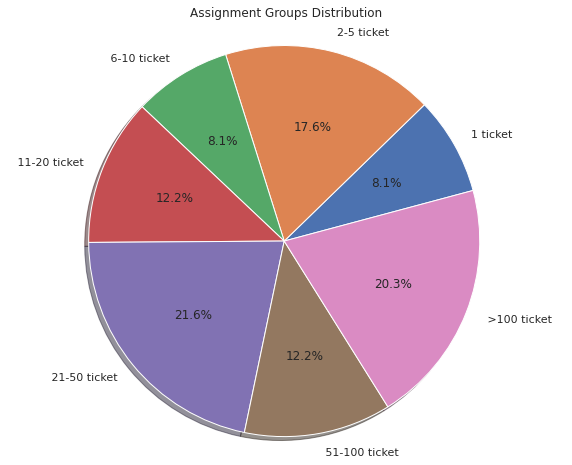

In [ ]:
plt.figure(figsize=(10, 8))
plt.pie(df_bins['Ticket Count'],labels=df_bins['Description'],autopct='%1.1f%%', startangle=15, shadow = True);
plt.title('Assignment Groups Distribution')
plt.axis('equal');

**Observation:**
* There are 15 Assignment group’s which have more than 100 tickets.
* Around 20% of the Assignment groups have greater than 100 tickets.

##### Derive insights on ticket distribution by L1/L2 and L3 Queues

In [ ]:
df_incidents_level = incidents.copy()
df_incidents_level['Target'] = np.where(df_incidents_level['Assignment group']=='GRP_0','L1/L2',np.where(df_incidents_level['Assignment group'] =='GRP_8','L1/L2','L3'))

Text(0, 0.5, 'samples')

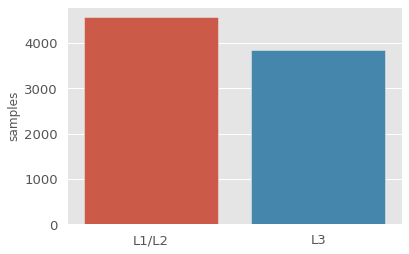

In [ ]:
x=df_incidents_level.Target.value_counts()
sns.barplot(x.index,x)
plt.gca().set_ylabel('samples')

**Observation:**

Given majority records are L1/L2, we assume group 0 and 8 records as L1/L2 tickets and try to observe how they stack up with respect to L3 tickets. L1/L2 records make up more than half of the total data.

#### Characters in Short description by L1/L2 and L3

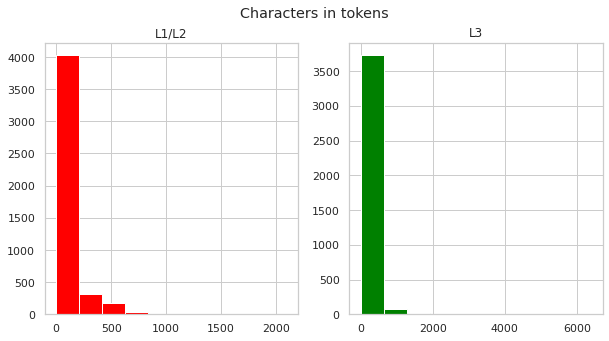

In [ ]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
text_len=df_incidents_level[df_incidents_level['Target']=='L1/L2']['tokens'].str.len()
ax1.hist(text_len.dropna(),color='red')
ax1.set_title('L1/L2')
text_len=df_incidents_level[df_incidents_level['Target']=='L3']['tokens'].str.len()
ax2.hist(text_len.dropna(),color='green')
ax2.set_title('L3')
fig.suptitle('Characters in tokens')
plt.show()

#### Words in Short description by L1/L2 and L3

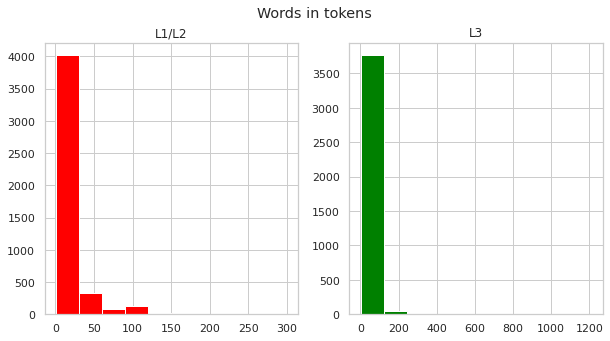

In [ ]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
text_len=df_incidents_level[df_incidents_level['Target']=='L1/L2']['tokens'].str.split().map(lambda x: len(str(x).split(" ")))
ax1.hist(text_len.dropna(),color='red')
ax1.set_title('L1/L2')
text_len=df_incidents_level[df_incidents_level['Target']=='L3']['tokens'].str.split().map(lambda x: len(str(x).split(" ")))
ax2.hist(text_len.dropna(),color='green')
ax2.set_title('L3')
fig.suptitle('Words in tokens')
plt.show()

**Observation:**

From the above graphs, we observe how the character and word count stack up for records for different support levels.

##### Take a look at the average (mean) number of words in each ticket, and the longest and shortest description in our data set

In [ ]:
incidents['desc_word_cnt'].mean()

20.150570884871552

In [ ]:
print(incidents['desc_word_cnt'].max())
print(incidents['desc_word_cnt'].min())

1210
0


In [ ]:
len(incidents[incidents['desc_word_cnt']==0])

47

**Average Word Count**

In [ ]:
def avg_word(sentence):
  words = sentence.split()
  if len(words) > 0:
    avg_cnt = sum(len(word) for word in words)/len(words)
  else:
    avg_cnt = 0
  return (avg_cnt)

df_incidents = incidents.copy()
df_incidents['avg_word'] = df_incidents['tokens'].apply(lambda x: avg_word(str(x)))
df_incidents.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt,avg_word
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138,22,5.318182
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132,19,6.000000
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9,4.777778
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26,5,4.400000
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11,2,5.000000


##### Visualize a distribution of the description word counts to see how skewed our average might be by outliers. 

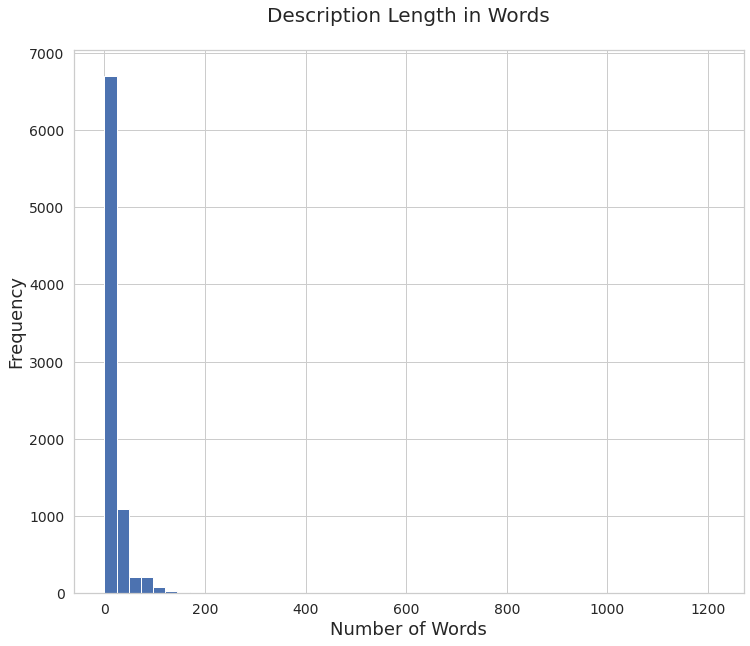

In [ ]:
ax=df_incidents['desc_word_cnt'].plot(kind='hist', bins=50, fontsize=14, figsize=(12,10))
ax.set_title('Description Length in Words\n', fontsize=20)
ax.set_ylabel('Frequency', fontsize=18)
ax.set_xlabel('Number of Words', fontsize=18);

**Observation:**

Though most records have length in the lower range, there is significant amount of data with longer sentences.

#### Number of unique words in each article

In [ ]:
df_incidents['uniq_wds'] = df_incidents['tokens'].str.split().apply(lambda x: len(set(x)))
df_incidents['uniq_wds'].head()

0    17
1    18
2     9
3     5
4     2
Name: uniq_wds, dtype: int64

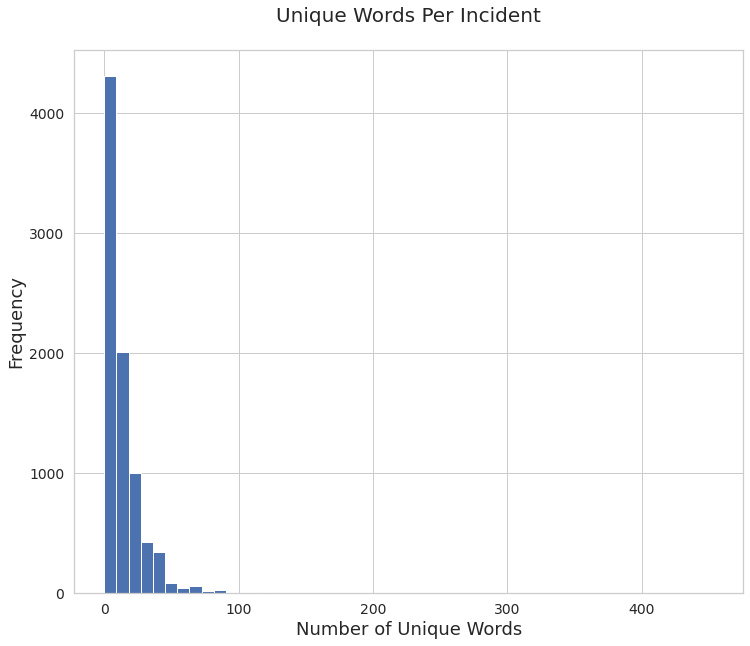

In [ ]:
ax=df_incidents['uniq_wds'].plot(kind='hist', bins=50, fontsize=14, figsize=(12,10))
ax.set_title('Unique Words Per Incident\n', fontsize=20)
ax.set_ylabel('Frequency', fontsize=18)
ax.set_xlabel('Number of Unique Words', fontsize=18);

When we plot this into a chart, we can see that while the distribution of unique words is still skewed, it looks a bit similar to the distribution based on total word counts we generated earlier.

##### Mean Number of Words in tickets per Assignment Group

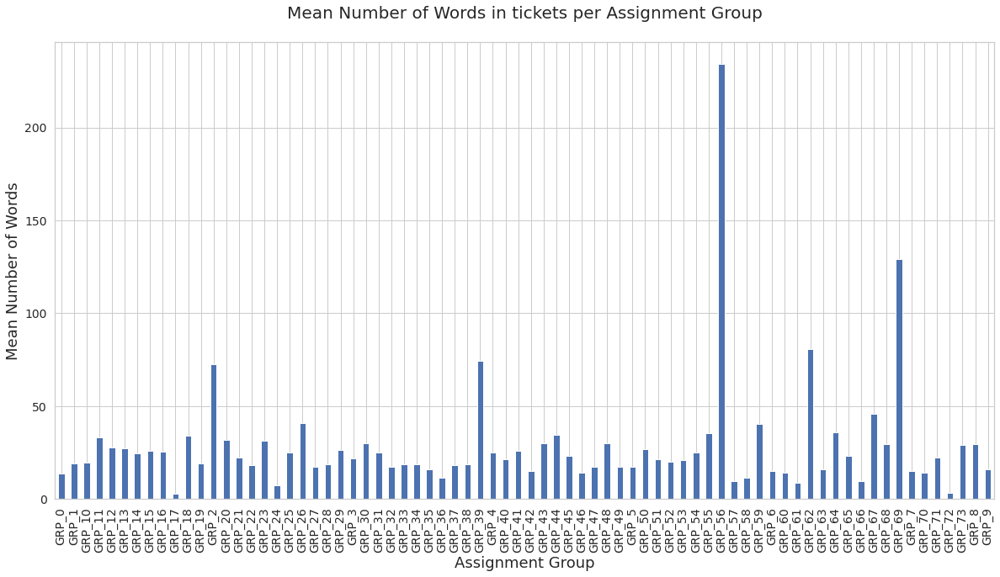

In [ ]:
assign_grps = df_incidents.groupby('Assignment group')
ax=assign_grps['desc_word_cnt'].aggregate(np.mean).plot(kind='bar', fontsize=14, figsize=(20,10))
ax.set_title('Mean Number of Words in tickets per Assignment Group\n', fontsize=20)
ax.set_ylabel('Mean Number of Words', fontsize=18)
ax.set_xlabel('Assignment Group', fontsize=18);

##### Mean Number of Unique Words in tickets per Assignment Group

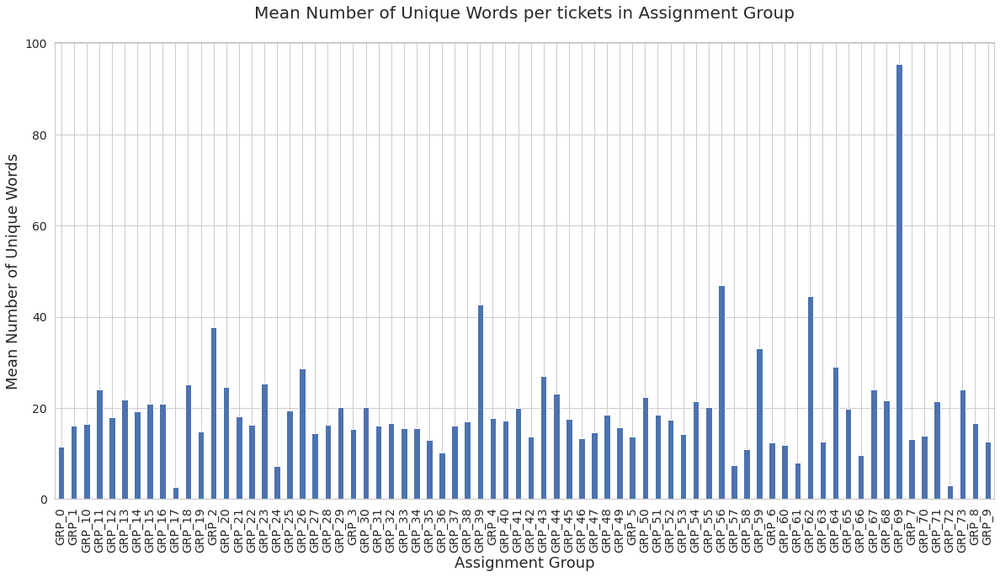

In [ ]:
ax=assign_grps['uniq_wds'].aggregate(np.mean).plot(kind='bar', fontsize=14, figsize=(20,10))
ax.set_title('Mean Number of Unique Words per tickets in Assignment Group\n', fontsize=20)
ax.set_ylabel('Mean Number of Unique Words', fontsize=18)
ax.set_xlabel('Assignment Group', fontsize=18);

##### The most common words over the entire corpus.



In [ ]:
wd_counts = Counter()
for i, row in df_incidents.iterrows():
    wd_counts.update(row['tokens'].split())
    
wd_counts.most_common(20)

[('com', 3646),
 ('job', 2520),
 ('receive', 2473),
 ('company', 2411),
 ('gmail', 2152),
 ('tool', 2053),
 ('please', 2034),
 ('yes', 2027),
 ('na', 1939),
 ('password', 1433),
 ('user', 1372),
 ('erp', 1207),
 ('sid', 1100),
 ('monitor', 1025),
 ('ticket', 1019),
 ('access', 1008),
 ('issue', 959),
 ('scheduler', 949),
 ('fail', 933),
 ('-PRON-', 899)]

##### WordCloud

A word cloud is a collection, or cluster, of words depicted in different sizes. The bigger and bolder the word appears, the more often it’s mentioned within a given text and the more important it is.

Also known as tag clouds or text clouds, these are ideal ways to pull out the most pertinent parts of textual data, often also help business users compare and contrast two different pieces of text to find the wording similarities between the two.

Let's write a generic method to generate Word Clouds for both Description column.

In [ ]:
def f_word_cloud(column):
    
    comment_words = ' '
    stopwords = set(STOPWORDS)

    # iterate through the csv file 
    for val in column: 

        # typecaste each val to string 
        val = str(val) 

        # split the value 
        tokens = val.split() 

        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 

        for words in tokens: 
            comment_words = comment_words + words + ' '


    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(comment_words) 
    
    return wordcloud

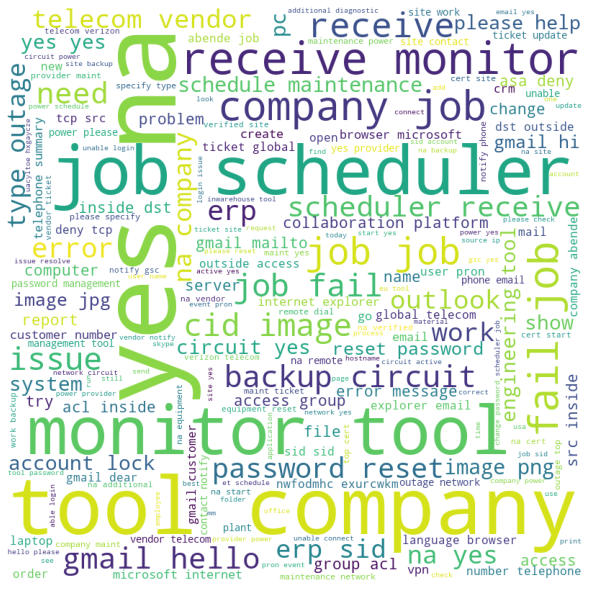

In [ ]:
wordcloud = f_word_cloud(incidents.tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

Word Cloud for tickets with Assignment group 'GRP_0'

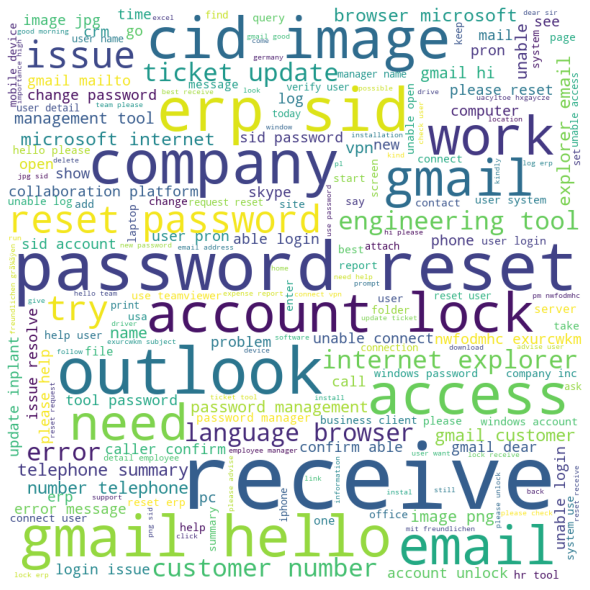

In [ ]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_0'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** 
* Analysis on GRP_0 which is the most frequent group to assign a ticket to reveals that this group deals with mostly the maintenance problems such as password reset, account lock, login issue, connectivity issue, ticket update etc.
* Maximum of the tickets from GRP_0 can be reduced by self correcting itself by putting automation scripts/mechanisms to help resolve these common maintenance issues. This will help in lowering the inflow of service tickets thereby saving the person/hour efforts spend and increasing the business revenue.

The word 'password' seems to be prominent for group 0 data, let us try a hypothesis testing procedure to conclude better.

In [ ]:
inc_hypo = incidents.copy()
inc_hypo['count_password']=inc_hypo.tokens.str.count("password")

In [ ]:
inc_hypo = inc_hypo[['Assignment group','count_password', 'desc_word_cnt']]
inc_hypo=inc_hypo.rename(columns={"Assignment group":"Assign_group"})
inc_hypo.head()

,Assign_group,count_password,desc_word_cnt
0,GRP_0,1,22
1,GRP_0,0,19
2,GRP_0,0,9
3,GRP_0,0,5
4,GRP_0,0,2


In [ ]:
inc_hypo.groupby(by=['Assign_group']).mean().sort_values(by='count_password',ascending=False)['count_password']

Assign_group
GRP_17    0.514706
GRP_53    0.454545
GRP_38    0.333333
GRP_0     0.331635
GRP_7     0.323529
            ...   
GRP_5     0.000000
GRP_26    0.000000
GRP_51    0.000000
GRP_52    0.000000
GRP_9     0.000000
Name: count_password, Length: 74, dtype: float64

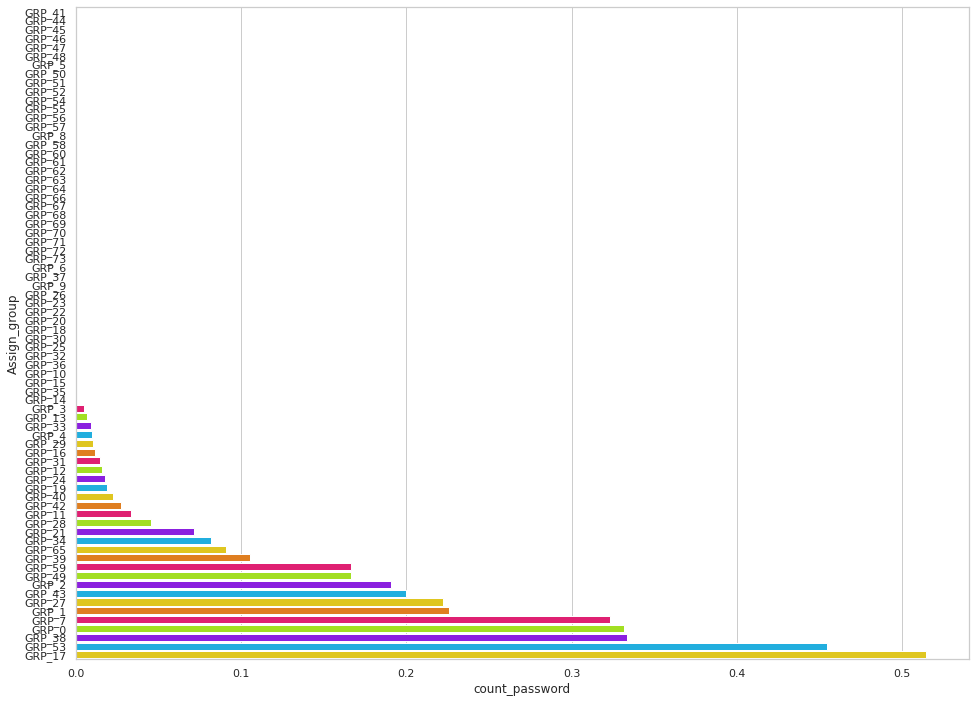

In [ ]:
rcParams['figure.figsize']=16,12
chart = sns.barplot(x = inc_hypo.groupby(by=['Assign_group']).mean().sort_values(by='count_password')['count_password'], 
                    y = inc_hypo.groupby(by=['Assign_group']).mean().sort_values(by='count_password').index, palette=HAPPY_COLORS_PALETTE)

### Step 1: State the null and alternative hypothesis:

* $H_0$: The word 'password' is equally probable to be present in tickets to all groups
* $H_A$: At least one group has close relevance to password related tickets


### Step 2: Decide the significance level

Here we select α = 0.05

### Step 3: Identify the test statistic

There are 38 groups as part of our analysis. These groups fall under select clusters which have sufficient records and have been built using SMOTE. Analysis of variance can determine the characteristic of the group (relevance with password related tickets). ANOVA uses F-tests to statistically test the equality of means.

### Step 4: Calculate p value using ANOVA table

* statsmodels.formula.api.ols creates a model from a formula and dataframe
* statsmodels.api.sm.stats.anova_lm gives an Anova table for one or more fitted linear models

In [ ]:
mod = ols('count_password ~ Assign_group', data = inc_hypo).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                   sum_sq      df         F        PR(>F)
Assign_group   219.109830    73.0  8.295679  2.436317e-81
Residual      3015.369714  8334.0       NaN           NaN


### Step 5:  Decide to reject or accept null hypothesis

In this example, p value is very close to 0 and it is less than our chosen level of signifance at 5%
So the statistical decision is to reject the null hypothesis at 5% level of significance.

### So there is sufficient evidence that the password related tickets are more specific to particular group.

### Determine which mean(s) is / are different

* An ANOVA test will test that at least one mean is different. 
* You have rejected the null hypothesis but do not know which mean(s) is / are different.
We use Tukey-krammer HSD test to detect which mean(s) is / are different.

In [ ]:
print(pairwise_tukeyhsd(inc_hypo['count_password'], inc_hypo['Assign_group']))

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
 GRP_0  GRP_1  -0.1058    0.9 -0.5583  0.3467  False
 GRP_0 GRP_10  -0.3316  0.001 -0.5475 -0.1158   True
 GRP_0 GRP_11  -0.2983    0.9 -0.7582  0.1616  False
 GRP_0 GRP_12  -0.3161  0.001 -0.4777 -0.1545   True
 GRP_0 GRP_13  -0.3247  0.001  -0.537 -0.1125   True
 GRP_0 GRP_14  -0.3316  0.001 -0.5661 -0.0972   True
 GRP_0 GRP_15  -0.3316 0.4814 -0.7407  0.0774  False
 GRP_0 GRP_16  -0.3199 0.0028  -0.595 -0.0447   True
 GRP_0 GRP_17   0.1831    0.9 -0.1239    0.49  False
 GRP_0 GRP_18  -0.3316  0.001 -0.6021 -0.0611   True
 GRP_0 GRP_19   -0.313  0.001 -0.4888 -0.1373   True
 GRP_0  GRP_2  -0.1408 0.3558 -0.3073  0.0258  False
 GRP_0 GRP_20  -0.3316 0.5467 -0.7518  0.0885  False
 GRP_0 GRP_21  -0.2602    0.9 -0.7361  0.2157  False
 GRP_0 GRP_22  -0.3316 0.7183 -0.7841  0.1209  False
 GRP_0 GRP_23  -0.3316    0.9 -0.8351  0.1719 

Word Cloud for tickets with Assignment group 'GRP_8'

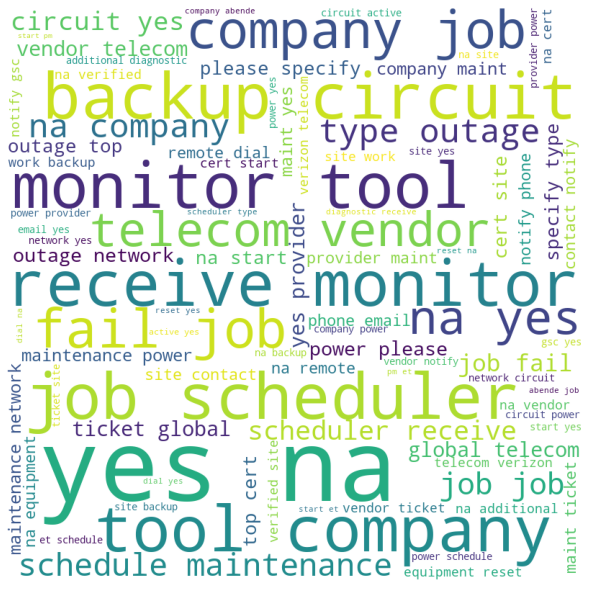

In [ ]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_8'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** GRP_8 seems to have tickets related to outage, job failures, monitoring tool etc

Word Cloud for tickets with Assignment group 'GRP_12'

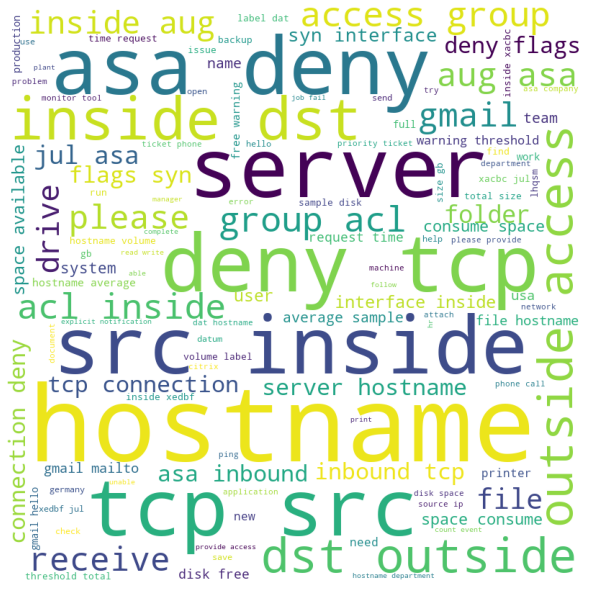

In [ ]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_12'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** GRP_12 contains tickets related to systems like disk space issues, network issues like tie out, citrix issue, connectivity timeout etc.

Word Cloud for tickets with Assignment group 'GRP_24'

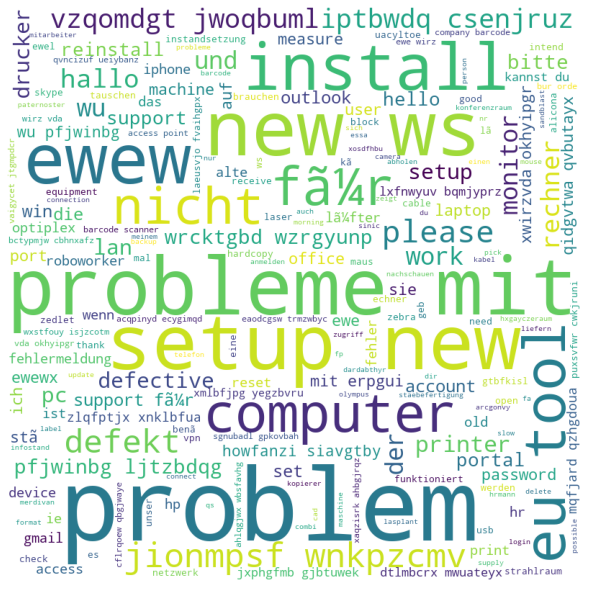

In [ ]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_24'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** GRP_24 - Tickets are mainly in german, these tickets were translated to english before passing it to our model.

#### Measure Readability of a ticket
The readability of a document says about the level of ease of understanding and interpretation .The readability of a text document can be checked using various readability indices like Flesch Reading Ease, Dale Chall Readability Score, and Gunning Fog Index.

For this, we can use the **textstat** library in Python. Textstat is typically used for determining readability, complexity, and grade level of a particular corpus. Each of these indices works on a different methodology for determining the readability level of a document.

In [ ]:
df_incidents['dale_chall_score']=df_incidents['tokens'].apply(lambda x: textstat.dale_chall_readability_score(x))
df_incidents['flesh_reading_ease']=df_incidents['tokens'].apply(lambda x: textstat.flesch_reading_ease(x))
df_incidents['gunning_fog']=df_incidents['tokens'].apply(lambda x: textstat.gunning_fog(x))

print('Dale Chall Score     =>',df_incidents['dale_chall_score'].mean())
print('Flesch Reading Score =>',df_incidents['flesh_reading_ease'].mean())
print('Gunning Fog Index    =>',df_incidents['gunning_fog'].mean())

Dale Chall Score     => 10.215447193149215
Flesch Reading Score => 44.46860608943841
Gunning Fog Index    => 11.984833491912399


**Observation:**
There is very little difference in the Dale Chall Score and the Gunning Fog Index. But there is a considerable amount of variation in the Flesch Reading Score.

Still, we cannot tell the difference in the readability of the two. The textstat library has a solution for this as well. It provides the text_standard() function. that uses various readability checking formulas, combines the result and returns the grade of education required to understand a particular document completel

In [ ]:
df_incidents['text_standard']=df_incidents['tokens'].apply(lambda x: textstat.text_standard(x))
print('Text Standard of Tickets =>',df_incidents['text_standard'].mode())

Text Standard of Tickets => 0    7th and 8th grade
dtype: object


**Observation:** 
The tickets are easily understandable by anyone who has completed the 9th or 10th grade in school.

Let’s take a look at the reading time of tickets. An average adult reads about 250 words per minute. We can also calculate the reading time of a document using the textstat library. It provides the reading_time() function, which takes a piece of text as an argument and returns the reading time for it in seconds.

In [ ]:
df_incidents['reading_time']=df_incidents['tokens'].apply(lambda x: textstat.reading_time(x))
print('Reading Time of =>',df_incidents['reading_time'].mean())

Reading Time of => 1.6332409609895306


**Observation:** On looking at the reading time, people usually find longer descriptions helpful (around 400-500 words).

#### Pickling the data post language translation for reuse, further preprocessing to be performed

In [ ]:
with open('incidents_trans.pickle', 'wb') as output:
    pickle.dump(incidents, output)

In [6]:
with open('incidents_trans.pickle', 'rb') as data:
    incidents = pickle.load(data)

## Topic Modeling
We need to convert our text into numbers or vectors. So following methods are used

### Count Vectorizer
The CountVectorizer method of vectorizing tokens transposes all the words/tokens into features and then provides a count of occurrence of each word. The result is called a document term matrix

In [ ]:
tf_vectorizer = CountVectorizer(max_df=0.9, min_df=25, max_features=5000)
tf = tf_vectorizer.fit_transform(incidents['tokens'].values.astype('U'))
tf_feature_names = tf_vectorizer.get_feature_names()
doc_term_matrix = pd.DataFrame(tf.toarray(), columns=list(tf_feature_names))
doc_term_matrix

,abende,able,accept,access,account,action,activate,activation,active,activity,ad,add,additional,address,admin,administrator,advise,aerp,affect,agent,alert,allow,already,also,alternate,amar,analysis,another,ap,apac,app,appear,application,approval,approve,area,asa,ask,assign,assignment,...,visitor,vlan,volume,von,vpn,want,warehouse,warm,warning,way,web,website,wednesday,week,welcome,well,wifi,win,window,windows,wireless,within,without,word,work,workflow,working,would,write,wrong,ws,www,yes,yesterday,µè,ºæ,å¼,æ³,æœ,çš
0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8403,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8404,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8405,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8406,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### LDA Topic Modelling
Now that we have prepared our data for topic modeling, we’ll be using the Latent Dirichlet Allocation (LDA) approach to determine the topics present in our corpus. In our model, we are going to produce 10 individual topics (ie. n_components). Once the model is created let’s create a function to display the identified topics. Each topic will consist of 10 words. The function will have three required parameters; the LDA model, feature names from the document term matrix, and the number of words per topic.

In [ ]:
lda_model = LatentDirichletAllocation(n_components=10, learning_method='online', max_iter=500, random_state=0).fit(tf)
no_top_words = 10
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic %d:" % (topic_idx))
        print(" ".join([feature_names[i]
                          for i in topic.argsort()[:-no_top_words - 1:-1]]))
              
display_topics(lda_model, tf_feature_names, no_top_words)

Topic 0:
com gmail receive please hello help company need send email
Topic 1:
user issue login pron system would sid connection call check
Topic 2:
job tool company com monitor receive scheduler fail sid hostname
Topic 3:
password erp account reset sid lock change tool unlock platform
Topic 4:
error erp hostname please server see order ip plant system
Topic 5:
event image pron cid would tcp asa windows png jpg
Topic 6:
access company usa vpn connect unable since go germany aug
Topic 7:
yes na site power circuit vendor backup telecom network start
Topic 8:
update outlook ticket pc crm work agent screen uacyltoe available
Topic 9:
unable engineering skype email name summary deny number internet microsoft


Topics produced via LDA are - 
* Topic 0 - Printer 
* Topic 1 - Job Scheduler
* Topic 2 - Power Outage 
* Topic 3 - Login Issues
* Topic 4 - Collaboration
* Topic 5 - Gmail
* Topic 6 - Password Reset
* Topic 7 - Outlook
* Topic 8 - ?
* Topic 9 - ?


In [ ]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(lda_model, tf, tf_vectorizer, mds='tsne')
panel

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
0       19.664444  218.966934       1        1  21.795189
4       35.298386 -420.763184       2        1  16.219354
7     -135.601730  -77.141159       3        1  12.237541
1      262.645752  464.208130       4        1   9.369651
2      489.546265  137.329376       5        1   9.140681
5     -205.600922  477.558838       6        1   6.686493
3     -374.654907 -319.849091       7        1   6.674466
9      199.562897  -62.837109       8        1   6.297759
8      435.192902 -311.588470       9        1   5.808559
6     -421.858368  135.021606      10        1   5.770307, topic_info=         Term         Freq        Total Category  logprob  loglift
329       job  2446.000000  2446.000000  Default  30.0000  30.0000
399        na  1991.000000  1991.000000  Default  29.0000  29.0000
717       yes  2082.000000  2082.000000  Default  28.0000  28.0000
446  password  1384.000000  1384.000000  Default  27.0000  27.0000
513   receive  2398.000000  2398.000000  Default  26.0000  26.0000
..        ...          ...          ...      ...      ...      ...
469        pm    95.976765   311.995026  Topic10  -4.2856   1.6736
709      work   120.053350   819.943673  Topic10  -4.0617   0.9311
79     center    72.002767   128.063548  Topic10  -4.5730   2.2766
260       get    79.978623   639.271796  Topic10  -4.4679   0.7739
206     error    77.620068   793.920546  Topic10  -4.4978   0.5273

[476 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
0         5  0.994363  abende
1         1  0.149091    able
1         2  0.146475    able
1         4  0.643443    able
1        10  0.060159    able
...     ...       ...     ...
712       6  0.480497   would
717       3  0.987070     yes
717       6  0.012482     yes
722       9  0.991147      æ³
723       9  0.985063      æœ

[565 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 5, 8, 2, 3, 6, 4, 10, 9, 7])

### NMF using TF-IDF 
LDA isn’t the only approach to topic modeling. Let’s try another method named the Non-Negative Matrix Factorization (NMF) approach and see if our topics can be slightly more defined. Instead of using the simple CountVectorizer method to vectorize our words/tokens, we’ll use the TF-IDF (Term Frequency — Inverse Document Frequency) method. The TF-IDF method helps to bring down the weight/impact of high-frequency words.

In [ ]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.90, min_df =25, max_features=5000, use_idf=True)
tfidf1 = tfidf_vectorizer.fit_transform(incidents['tokens'])
tfidf_feature_names = tfidf_vectorizer.get_feature_names()
doc_term_matrix_tfidf = pd.DataFrame(tfidf1.toarray(), columns=list(tfidf_feature_names))
doc_term_matrix_tfidf

,abende,able,accept,access,account,action,activate,activation,active,activity,ad,add,additional,address,admin,administrator,advise,aerp,affect,agent,alert,allow,already,also,alternate,amar,analysis,another,ap,apac,app,appear,application,approval,approve,area,asa,ask,assign,assignment,...,visitor,vlan,volume,von,vpn,want,warehouse,warm,warning,way,web,website,wednesday,week,welcome,well,wifi,win,window,windows,wireless,within,without,word,work,workflow,working,would,write,wrong,ws,www,yes,yesterday,µè,ºæ,å¼,æ³,æœ,çš
0,0.0,0.172378,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.217947,0.0,0.0,0.0,0.0,0.0,0.210423,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.244737,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.277269,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.478623,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.000000,0.0,0.382403,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8403,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.429138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8404,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8405,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.499522,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8406,0.0,0.000000,0.0,0.333324,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [ ]:
len(tfidf1.todense())

8408

In [ ]:
nmf = NMF(n_components=10, random_state=0, alpha=.1, init='nndsvd').fit(tfidf1)
display_topics(nmf, tfidf_feature_names, no_top_words)

Topic 0:
job scheduler monitor fail tool company receive com abende sid
Topic 1:
password reset windows management request change tool manager please ess
Topic 2:
gmail com receive please image cid hello png help mailto
Topic 3:
account lock windows unlock ad get please window expire unlocked
Topic 4:
yes na circuit power site telecom backup vendor outage cert
Topic 5:
unable outlook connect login skype open vpn launch log engineering
Topic 6:
ticket update inplant inc driver printer query call information incident
Topic 7:
erp sid unlock reset log production system account hana logon
Topic 8:
internet email explorer browser number summary telephone microsoft customer language
Topic 9:
user issue login pron would please error system work able


Topics produced via NMF are - 
* Topic 0 - Scheduler 
* Topic 1 - Password Reset
* Topic 2 - Gmail
* Topic 3 - Account Lock
* Topic 4 - Printer
* Topic 5 - Power Outage
* Topic 6 - Login Issue
* Topic 7 - User account
* Topic 8 - Browser
* Topic 9 - Outlook

The topics produced via NMF seem to be much more distinct compared to LDA.

Let’s add both the LDA and NMF topics into our dataframe for further analysis. Let’s also remap the integer topics into our subjectively derived topic labels.

In [ ]:
nmf_topic_values = nmf.transform(tfidf1)
df_incidents_level['nmf_topics'] = nmf_topic_values.argmax(axis=1)
lda_topic_values = lda_model.transform(tf)
df_incidents_level['lda_topics'] = lda_topic_values.argmax(axis=1)
lda_remap = {0: 'Printer', 1: 'Job Scheduler', 2: 'Power Outage', 3: 'Login Issues', 
             4: 'Collaboration', 5: 'Gmail', 6: 'Passowrd Reset', 
             7: 'Outlook', 8: 'Unknown1', 9: 'Unknown2'}
df_incidents_level['lda_topics'] = df_incidents_level['lda_topics'].map(lda_remap)
nmf_remap = {0: 'Scheduler', 1: 'Password Reset', 2: 'Gmail', 3: 'Account Lock', 
             4: 'Printer', 5: 'Power Outage', 6: 'Login Issue', 7: 'User Account', 
             8: 'Browser', 9: 'Outlook'}
df_incidents_level['nmf_topics'] = df_incidents_level['nmf_topics'].map(nmf_remap)

##### Plot the top most reasons for raising a ticket

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]),
 <a list of 7 Text major ticklabel objects>)

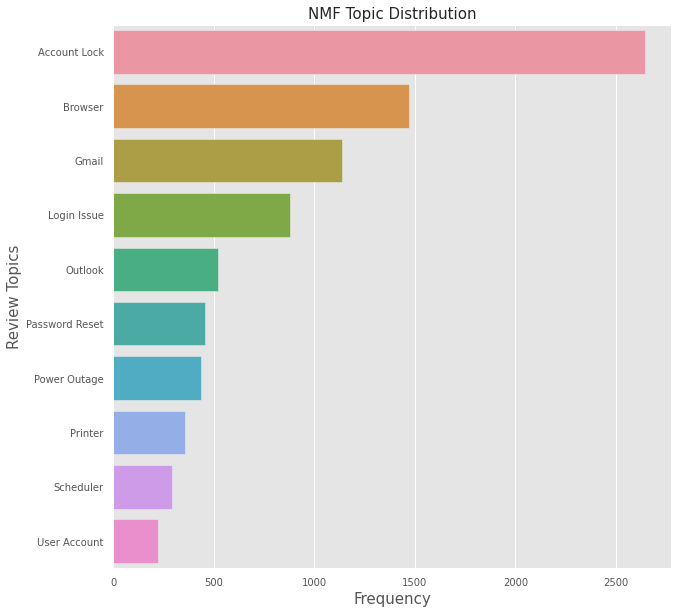

In [ ]:
nmf_x = df_incidents_level['nmf_topics'].value_counts()
nmf_y = nmf_x.sort_index()
plt.figure(figsize=(10,10))
sns.barplot(nmf_x, nmf_y.index)
plt.title("NMF Topic Distribution", fontsize=15)
plt.ylabel('Review Topics', fontsize=15)
plt.yticks(fontsize=10)
plt.xlabel('Frequency', fontsize=15)
plt.xticks(fontsize=10)

#### Try and see if the data could be clustered

In [ ]:
def create_bag_of_words(X):
    vectorizer = CountVectorizer(analyzer = "word", tokenizer = None, preprocessor = None, stop_words = 'english', ngram_range = (1,3), max_features = 10000) 
    train_data_features = vectorizer.fit_transform(X)
    train_data_features = train_data_features.toarray()
    
    # tfidf transform
    from sklearn.feature_extraction.text import TfidfTransformer
    tfidf = TfidfTransformer()
    tfidf_features = tfidf.fit_transform(train_data_features).toarray()

    # Get words in the vocabulary
    vocab = vectorizer.get_feature_names()
      
    return vectorizer, vocab, train_data_features, tfidf_features, tfidf

In [ ]:
# word level tf-idf for ticket
vectorizer, vocab, train_data_features, tfidf_features, tfidf  =  create_bag_of_words(incidents['Description'])

In [ ]:
#  create a dictionary mapping the tokens to their tfidf values
bag_dictionary = pd.DataFrame()
bag_dictionary['ngram'] = vocab
bag_dictionary['count'] = train_data_features[0]
bag_dictionary['tfidf_features'] = tfidf_features[0]

# Sort by raw count
bag_dictionary.sort_values(by=['count'], ascending=False, inplace=True)
# Show top 10
print(bag_dictionary.head(10))

                         ngram  count  tfidf_features
9041                      user      3        0.232925
4931                     login      2        0.178979
268                    advised      1        0.134034
2084  details employee manager      1        0.138220
5128           manager checked      1        0.148469
5127                   manager      1        0.098086
270               advised user      1        0.138220
271         advised user login      1        0.146149
4932               login check      1        0.145426
4933        login check caller      1        0.146149


In [ ]:
sorted_by_idf = np.argsort(tfidf.idf_)
feature_names = np.array(vectorizer.get_feature_names())
print("Features with lowest idf:\n{}".format(feature_names[sorted_by_idf[:10]]))
print("\nFeatures with highest idf:\n{}".format(feature_names[sorted_by_idf[-10:]]))

Features with lowest idf:
['com' 'received' 'company' 'tool' 'gmail' 'gmail com' 'company com' 'job'
 'monitoring' 'monitoring tool']

Features with highest idf:
['dengic location united' 'gxuvbcpr' 'png ead' 'srvr' 'srvr dmprmb'
 'omforiginalsexport' 'omforiginalsexport java' 'xnezhsit' 'ft torx'
 'cihaz']


Below is the 10 tokens with the lowest tfidf score, which is unsurprisingly, very generic words that we could not use to distinguish one description from another.

In [ ]:
bag_dictionary.sort_values(by=['count'], ascending=True).head(10)

,ngram,count,tfidf_features
8318,tcp device information,0,0.0
32,able view,0,0.0
41,absender und lã,0,0.0
33,aborted,0,0.0
34,aborted disk,0,0.0
35,aborted disk agents,0,0.0
36,aborted media,0,0.0
37,aborted media agents,0,0.0
38,aborting,0,0.0
39,absender,0,0.0


Below is the 10 tokens with the highest tfidf score, which includes words that are a lot specific that by looking at them, we could guess the categories that they belong to:

In [ ]:
bag_dictionary.sort_values(by=['count'], ascending=False).head(10)

,ngram,count,tfidf_features
9041,user,3,0.232925
4931,login,2,0.178979
970,caller confirmed,1,0.125968
201,ad reset,1,0.166329
202,ad reset password,1,0.166329
9214,verified,1,0.105729
9217,verified user,1,0.138220
9218,verified user details,1,0.138220
2567,employee manager,1,0.138220
6097,password advised,1,0.166329


**TF-IDF Distribution**

In [ ]:
# word level tf-idf for ticket
tfidf3 = TfidfVectorizer(max_features=250, analyzer = 'word', min_df=2, max_df=0.95, ngram_range=(1, 2))
inc_tfidf = tfidf3.fit_transform(incidents['tokens'])

In [ ]:
#  create a dictionary mapping the tokens to their tfidf values
tfidf4 = dict(zip(tfidf3.get_feature_names(), tfidf3.idf_))
tfidf4 = pd.DataFrame(columns=['tfidf']).from_dict(
                    dict(tfidf4), orient='index')
tfidf4.columns = ['tfidf']

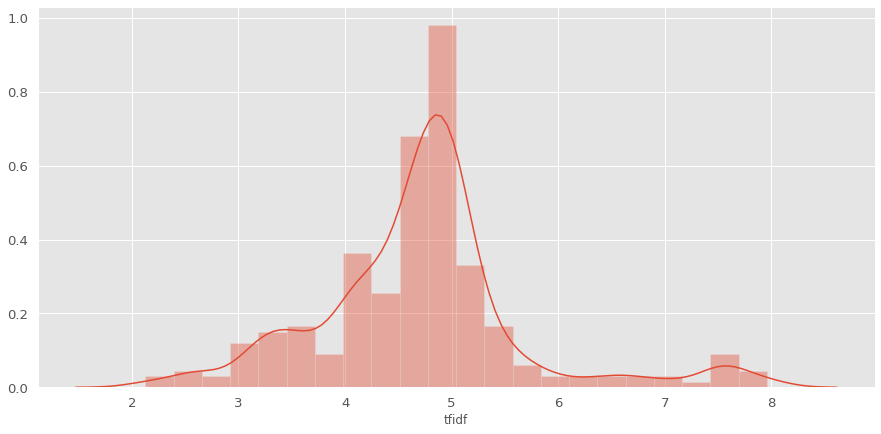

In [ ]:
plt.figure(figsize=(15,7))
sns.distplot(tfidf4['tfidf'])

Given the high dimension of our tfidf matrix, we need to reduce their dimension using the Singular Value Decomposition (SVD) technique. And to visualize our vocabulary, we could next use t-SNE to reduce the dimension to 2. t-SNE is more suitable for dimensionality reduction to 2 or 3.

#### Dimensionality Reduction using t-SNE

In [ ]:
n_comp=10
svd = TruncatedSVD(n_components=n_comp, random_state=42)
svd_tfidf = svd.fit_transform(tfidf1)

In [ ]:
tsne_model = TSNE(n_components=2, verbose=1, random_state=42, n_iter=500)
tsne_tfidf = tsne_model.fit_transform(svd_tfidf)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8408 samples in 0.005s...
[t-SNE] Computed neighbors for 8408 samples in 0.666s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8408
[t-SNE] Computed conditional probabilities for sample 2000 / 8408
[t-SNE] Computed conditional probabilities for sample 3000 / 8408
[t-SNE] Computed conditional probabilities for sample 4000 / 8408
[t-SNE] Computed conditional probabilities for sample 5000 / 8408
[t-SNE] Computed conditional probabilities for sample 6000 / 8408
[t-SNE] Computed conditional probabilities for sample 7000 / 8408
[t-SNE] Computed conditional probabilities for sample 8000 / 8408
[t-SNE] Computed conditional probabilities for sample 8408 / 8408
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.916306
[t-SNE] KL divergence after 500 iterations: 1.104658


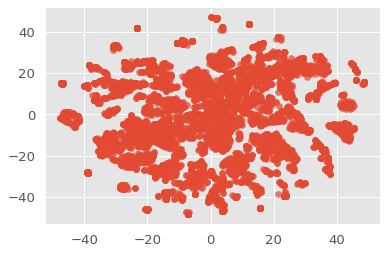

In [ ]:
tfidf_df = pd.DataFrame(tsne_tfidf, columns=['x', 'y'])
plt.scatter(tfidf_df.x, tfidf_df.y, alpha=0.7)

**Observation:**
We can see there are multiple smaller clusters here, each cluster could be the type of tickets that we have in the dataset.

## Agglomerative Clustering


In [ ]:
incidents['Group id'] = incidents['Assignment group'].factorize()[0]
incidents.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt,Group id
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138,22,0
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132,19,0
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9,0
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26,5,0
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11,2,0


In [ ]:
group_id_df = incidents[['Assignment group', 'Group id']].drop_duplicates().sort_values('Group id')

In [ ]:
group_to_id = dict(group_id_df.values)
id_to_group = dict(group_id_df[['Group id', 'Assignment group']].values)

### Get Embeddings from Glove

In [ ]:
glove_file = "glove.6B.zip"
#Extract Glove embedding zip file
with ZipFile(glove_file, 'r') as z:
  z.extractall()

In [ ]:
EMBEDDING_FILE = './glove.6B.300d.txt'

embeddings = {}
for o in open(EMBEDDING_FILE):
    word = o.split(" ")[0]
    embd = o.split(" ")[1:]
    embd = np.asarray(embd, dtype='float32')
    embeddings[word] = embd

In [ ]:
def get_sentence_embedding(tokens, vector):
  if len(tokens)<1:
    return np.zeros(300)
  sentvec = [vector[word] if word in vector else np.zeros(300) for word in tokens]
  length = len(sentvec)
  sum = np.sum(sentvec, axis=0)
  avg = np.divide(sum,length)
  return(avg)

In [ ]:
incidents['embedding'] = incidents['tokens'].apply(lambda x: get_sentence_embedding(x, embeddings))

In [ ]:
incidents.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt,Group id,embedding
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138,22,0,"[-0.24095591107059433, 0.06928248098794965, -0..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132,19,0,"[-0.25078766922480566, 0.07879859299370737, -0..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9,0,"[-0.18236102760020717, 0.1377793746251686, -0...."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26,5,0,"[-0.20744724489318636, 0.03561946491782482, -0..."
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11,2,0,"[-0.31042483377016405, -0.13657435978000815, -..."


In [ ]:
inc_clus = pd.DataFrame(incidents['Assignment group'].unique(),columns=['Assignment group'])

In [ ]:
for i in incidents['Assignment group'].unique():
  inc_clus.loc[inc_clus['Assignment group']==i,'embedding'] = pd.Series([np.mean(incidents[incidents['Assignment group']==i]['embedding'])],
                                                                        index=inc_clus.loc[inc_clus['Assignment group']==i].index,dtype='object')
  inc_clus.loc[inc_clus['Assignment group']==i,'frequency'] = pd.Series(incidents[incidents['Assignment group']==i].shape[0],
                                                                        index=inc_clus.loc[inc_clus['Assignment group']==i].index,dtype='object')

In [ ]:
#Agglomerative Clustering
model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='average')
model.fit(inc_clus['embedding'].values.tolist())

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='average', memory=None, n_clusters=5,
                        pooling_func='deprecated')

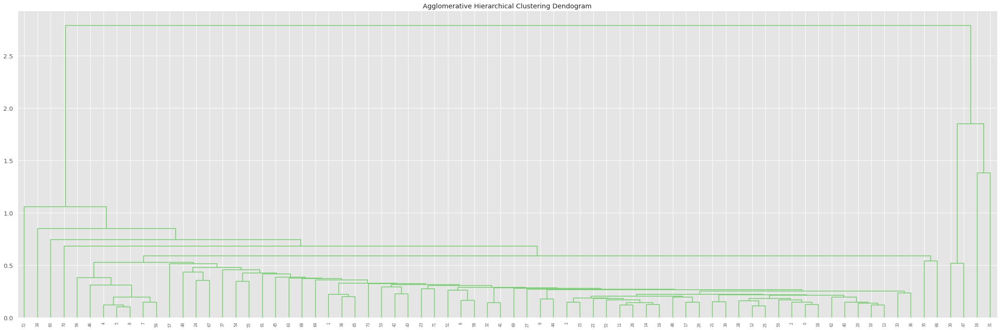

In [ ]:
plt.figure(figsize=(30, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
Z = linkage(inc_clus['embedding'].values.tolist(), metric='euclidean', method='average')
dendrogram(Z, leaf_rotation=90, color_threshold=40, leaf_font_size=8)
plt.tight_layout()

**Observation:**

From the above graph, records for specific groups are largely different from most other groups which seem to be similar. The motive behind performing clustering is to counter the class imbalance in our data. When we choose to form clusters, it needs to satisfy the below condition:
* The clusters must restore some class balance in our data so that our classification model can predict precisely
* The clusters must not be a combination of large number of assignment groups each, if so then we will not be able to infer properly from the classification

Going by this logic, we go with 45 clusters

In [ ]:
model = AgglomerativeClustering(n_clusters=45, affinity='euclidean',  linkage='average')
model.fit(inc_clus['embedding'].values.tolist())

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='average', memory=None, n_clusters=45,
                        pooling_func='deprecated')

In [ ]:
inc_clus['class'] = model.labels_
inc_clus['class'].value_counts()

0     11
10     7
3      5
4      5
1      2
18     2
7      2
8      2
21     2
14     1
19     1
17     1
16     1
15     1
11     1
13     1
12     1
2      1
9      1
6      1
5      1
20     1
44     1
43     1
23     1
42     1
41     1
40     1
39     1
38     1
37     1
36     1
35     1
34     1
33     1
32     1
31     1
30     1
29     1
28     1
27     1
26     1
25     1
24     1
22     1
Name: class, dtype: int64

We can see that most of the clusters have only one group each. This is not an ideal scenario since then there are lot of labels to classify.

In [ ]:
for i in incidents['Assignment group'].unique():
  incidents.loc[incidents['Assignment group']==i,'class'] = inc_clus[inc_clus['Assignment group']==i]['class'].values[0]

In [ ]:
clus_arrngmt = pd.DataFrame([(i,inc_clus[inc_clus['class']==i]['Assignment group'].values) for i in inc_clus['class'].unique()],columns=['cluster id','cluster groups'])
clus_arrngmt.set_index('cluster id',inplace=True)
clus_arrngmt['ticket_counts'] = incidents['class'].value_counts()
clus_arrngmt['class_counts'] = inc_clus['class'].value_counts()
clus_arrngmt.reset_index(inplace=True)
clus_arrngmt.head()

,cluster id,cluster groups,ticket_counts,class_counts
0,10,"[GRP_0, GRP_3, GRP_13, GRP_19, GRP_25, GRP_28,...",4654,7
1,41,[GRP_1],31,1
2,0,"[GRP_4, GRP_12, GRP_15, GRP_16, GRP_18, GRP_2,...",1010,11
3,3,"[GRP_5, GRP_6, GRP_8, GRP_9, GRP_60]",1224,5
4,18,"[GRP_7, GRP_59]",74,2


In [ ]:
clus_arrngmt.sort_values(by='ticket_counts',ascending=False,inplace=True)
clus_arrngmt=clus_arrngmt[clus_arrngmt['ticket_counts']>68]
clus_arrngmt.sum()

cluster id        133
ticket_counts    7957
class_counts       38
dtype: int64

**Observation:**

We have tried to counter the challenges by filtering those clusters which are associated with at least 100 records. We have arrived at 10 clusters, the class balance has been improved slightly.

In [ ]:
clus_arrngmt

,cluster id,cluster groups,ticket_counts,class_counts
0,10,"[GRP_0, GRP_3, GRP_13, GRP_19, GRP_25, GRP_28,...",4654,7
3,3,"[GRP_5, GRP_6, GRP_8, GRP_9, GRP_60]",1224,5
2,0,"[GRP_4, GRP_12, GRP_15, GRP_16, GRP_18, GRP_2,...",1010,11
10,23,[GRP_24],285,1
6,4,"[GRP_11, GRP_14, GRP_20, GRP_41, GRP_62]",249,5
5,8,"[GRP_10, GRP_45]",175,2
14,7,"[GRP_33, GRP_42]",144,2
4,18,"[GRP_7, GRP_59]",74,2
8,21,"[GRP_21, GRP_40]",73,2
13,39,[GRP_31],69,1


In [ ]:
clus_arrngmt['cluster id'].values

array([10,  3,  0, 23,  4,  8,  7, 18, 21, 39])

In [ ]:
incidents_clust = incidents[incidents['class'].isin(clus_arrngmt['cluster id'].values)]
incidents_clust.shape

(7957, 9)

In [ ]:
clus_arrngmt['cluster id'] = clus_arrngmt['cluster id'].map({10:0, 3:1, 0:2, 23:3, 4:4, 8:5, 7:6, 18:7, 21:8, 39:9})
incidents_clust['class'] = incidents_clust['class'].map({10:0, 3:1, 0:2, 23:3, 4:4, 8:5, 7:6, 18:7, 21:8, 39:9})

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
incidents_clust['class'].value_counts()

0    4654
1    1224
2    1010
3     285
4     249
5     175
6     144
7      74
8      73
9      69
Name: class, dtype: int64

Based on the above deductions, we will only focus on the 36 groups above clustered into 8 classes for building various supervised machine learning models. Other clusters/classes have very less number of records for our model to understand and predict.

### Model Building

Let's proceed towards trying different model architectures mentioned below to classify the problem and validate which one is outperforming.

* Multinomial Naive Bayes
* K Nearest neighbor
* Support Vector Machine
* Decision Tree
* Random Forest
* Logistic Regression
* SGD Classifier

Let's write some generic methods for utilities and to plot evaluation metrics.

In [ ]:
#Create a dataframe to capture the accuracy and f1-score of various models   
log_cols=["Classifier", "f1_score"]
log = pd.DataFrame(columns=log_cols)

##### Create a function for various classification models

In [ ]:
# A class that logs the time
class Timer():
    '''
    A generic class to log the time
    '''
    def __init__(self):
        self.start_ts = None
    def start(self):
        self.start_ts = time()
    def stop(self):
        return 'Time taken: %2fs' % (time()-self.start_ts)
    
timer = Timer()

# A method that plots the Precision-Recall curve
def plot_prec_recall_vs_thresh(precisions, recalls, thresholds):
    plt.figure(figsize=(10,5))
    plt.plot(thresholds, precisions[:-1], 'b--', label='precision')
    plt.plot(thresholds, recalls[:-1], 'g--', label = 'recall')
    plt.xlabel('Threshold')
    plt.legend()

# A method to train and test the model
def run_classification(estimator, X_train, X_test, y_train, y_test, clfname, arch_name=None, pipelineRequired=False, isDeepModel=False):
    global log
    timer.start()
    # train the model
    clf = estimator
    modelname = clfname
   
    if pipelineRequired :
        clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
        clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=10, batch_size=128,verbose=1,callbacks=call_backs(arch_name))
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)
    else :
        clf.fit(X_train, y_train)
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
    
    print('Estimator:', clf)
    print('='*80)
    print('Training accuracy: %.2f%%' % (accuracy_score(y_train,y_train_pred) * 100))
    print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, y_pred) * 100))
    print('='*80)
    print('Confusion matrix:\n %s' % (confusion_matrix(y_test, y_pred)))
    print('='*80)
    print('Classification report:\n %s' % (classification_report(y_test, y_pred)))
    print(timer.stop(), 'to run the model')
    log_entry = pd.DataFrame([[modelname,f1_score(y_pred, y_test,average='weighted')]], columns=log_cols)
    log = log.append(log_entry)


### Classification Models on Bag of Words

In [ ]:
vectorizer, vocab, train_data_features, tfidf_features, tfidf  =  create_bag_of_words(incidents_clust['Description'])

NameError: ignored

In [ ]:
X = tfidf_features
y = incidents_clust['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20)

**Multinomial Naive Bayes**

In [ ]:
run_classification(MultinomialNB(), X_train, X_test, y_train, y_test,"MultinomialNB-BOW")

ValueError: ignored

**Linear SVC**

In [ ]:
run_classification(OneVsRestClassifier(LinearSVC(loss='hinge',random_state=42,class_weight='balanced')), X_train, X_test, y_train, y_test, "LinearSVC-BOW")

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Estimator: OneVsRestClassifier(estimator=LinearSVC(C=1.0, class_weight='balanced',
                                        dual=True, fit_intercept=True,
                                        intercept_scaling=1, loss='hinge',
                                        max_iter=1000, multi_class='ovr',
                                        penalty='l2', random_state=42,
                                        tol=0.0001, verbose=0),
                    n_jobs=None)
Training accuracy: 54.64%
Testing accuracy: 51.80%
Confusion matrix:
 [[ 23   1  21  12  33  14   9  42  21   9]
 [ 11 137   4   2   9  11   3   3   6   0]
 [ 18   8  68   4  25  13  14  17  15   2]
 [  6   0   4 134   6   1  18  12   5   3]
 [ 13   3  24   5  90  17   9   9  15   2]
 [  9  37  25   6  18  46  14  18  12   0]
 [ 14   0  11  12   6  11 100  29  19   3]
 [ 18   0  10  14   2   0   3 109   7   0]
 [ 13   4  13   1  22   2   0   5 111   0]
 [  9   0   6   0   8   2   3   3  17 133]]
Classification report:
     

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


**SGD Classifier**

In [ ]:
run_classification(SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=100, tol=None,class_weight='balanced'), 
                   X_train, X_test, y_train, y_test, "SGDClassifier-BOW")

Estimator: SGDClassifier(alpha=0.001, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=100, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=42, shuffle=True, tol=None,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 44.13%
Testing accuracy: 43.90%
Confusion matrix:
 [[ 47  11   2  37   9   3  31  34   5   6]
 [ 34 126   1   3   3   3  10   2   2   2]
 [ 36  11  10  30  11  10  43  21   7   5]
 [  1   0   2 161   0   0  22   1   1   1]
 [ 59   6   4  11  38  14  41   7   6   1]
 [ 33  67   1  11   9  16  24  18   5   1]
 [ 17   0   2  34   0   3 136  12   1   0]
 [ 34   0   1  22   0   2  10  93   1   0]
 [ 56  13   5   2   5  15  22   1  52   0]
 [ 17   0   0   4   1   0  15   8   9 127]]
Classification report:
               precision    recall  f1-s

**Logistic Regression**

In [ ]:
run_classification(LogisticRegression(n_jobs=1, C=1e5,class_weight='balanced'), X_train, X_test, y_train, y_test, "LogisticRegression-BOW")

Estimator: LogisticRegression(C=100000.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=1, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 57.64%
Testing accuracy: 55.12%
Confusion matrix:
 [[ 32   1  24  15  31  10   8  34  22   8]
 [  9 141   4   1  10   7   2   2   9   1]
 [ 20  15  65   7  22   8  11  13  21   2]
 [  4   0   3 151   2   1  17   5   4   2]
 [ 17   4  16   4  96   7  13  11  18   1]
 [  7  43  20   5  21  37  15  20  17   0]
 [ 13   1  13  16   4   6 118  20  12   2]
 [ 16   0   8  17   5   1   4 103   9   0]
 [  7   7  11   2  15   0   0   1 128   0]
 [ 18   0   6   0   1   2   0   3  10 141]]
Classification report:
               precision    recall  f1-score   support

           0       0.22      0.17      0.20       185
           1       0.6

**Random Forest Classifier**

In [ ]:
le = LabelEncoder()
tokenizer = Tokenizer(num_words= 10000)
tokenizer.fit_on_texts(incidents_clust['Description'])
maxlen = 300

In [ ]:
X_M1 = tokenizer.texts_to_sequences(incidents_clust['Description'])
X_M1 = pad_sequences(X_M1, maxlen = maxlen)
y_M1 = np.asarray(incidents_clust['class'])

In [ ]:
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_M1, y_M1, test_size = 0.3)

In [ ]:
run_classification(RandomForestClassifier(max_depth=15, random_state=0, class_weight="balanced"), X_train_2, X_test_2, y_train_2, y_test_2, "RandomForest-BOW")

Estimator: RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=0, verbose=0, warm_start=False)
Training accuracy: 95.73%
Testing accuracy: 53.68%
Confusion matrix:
 [[141   6 108   5   7   4   4   2   2   0]
 [ 24 285  46   3   3   0   2   1   1   1]
 [ 66  24 173   3  17   4   3   0   1   2]
 [  9   0   3  52   0   0   4   0   0   0]
 [ 30   6  47   0   4   1   2   1   0   1]
 [  5  14  21   0   0  16   0   1   0   0]
 [  8   0  11  12   1   0   7   0   0   0]
 [ 10   0   8   0   1   0   0   0   1   0]
 [  7   2  17   0   0   1   0   0   0   0]
 [ 14   1   6   1   0   0   1   0   0   1

**Decision Tree Classifier**

In [ ]:
run_classification(DecisionTreeClassifier(), X_train_2, X_test_2, y_train_2, y_test_2, "DecisionTree-BOW")

Estimator: DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
Training accuracy: 98.71%
Testing accuracy: 49.01%
Confusion matrix:
 [[119  25  72   8  20   8  11   5   7   4]
 [ 21 295  31   2   7   3   1   4   1   1]
 [ 77  30 125   6  20   7  11   7   8   2]
 [ 10   0   5  45   0   0   5   1   2   0]
 [ 27   9  36   1   7   3   1   3   2   3]
 [  9  15  10   0   4  17   0   0   1   1]
 [ 13   2   6   5   1   0   9   0   1   2]
 [ 10   1   6   0   1   0   0   1   0   1]
 [  8   1  11   0   3   2   0   1   0   1]
 [  9   1   6   1   1   1   1   1   1   2]]
Classification report:
               precision    recall  f1-score   support

    

**K-Nearest Neighbours**

In [ ]:
run_classification(KNeighborsClassifier(n_neighbors= 5 , weights = 'distance'), X_train_2, X_test_2, y_train_2, y_test_2, "KNN-BOW")

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='distance')
Training accuracy: 98.71%
Testing accuracy: 49.17%
Confusion matrix:
 [[127  42  70  14  11   1   6   5   1   2]
 [ 19 289  42   3   4   1   1   2   5   0]
 [ 75  53 131  12  10   1   5   4   1   1]
 [ 10   0   3  50   0   0   4   0   0   1]
 [ 30  10  34   2   6   3   3   3   1   0]
 [ 12  13  14   0   2  16   0   0   0   0]
 [ 13   3   8  12   0   0   3   0   0   0]
 [  8   1   7   0   2   0   0   0   1   1]
 [  9   5  10   0   1   1   0   1   0   0]
 [  9   4   7   3   0   1   0   0   0   0]]
Classification report:
               precision    recall  f1-score   support

           0       0.41      0.46      0.43       279
           1       0.69      0.79      0.74       366
           2       0.40      0.45      0.42       293
           3       0.52      0.74      0.61        68
     

In [ ]:
log.set_index(["Classifier"],inplace=True)
log.sort_values(by=['f1_score'])

,f1_score
Classifier,
SGDClassifier,0.466721
SGDClassifier-BOW,0.466721
DecisionTree-BOW,0.497131
KNN-BOW,0.517381
LinearSVC,0.525260
LinearSVC-BOW,0.525260
RandomForest-BOW,0.555925
LogisticRegression,0.565186
LogisticRegression-BOW,0.565186


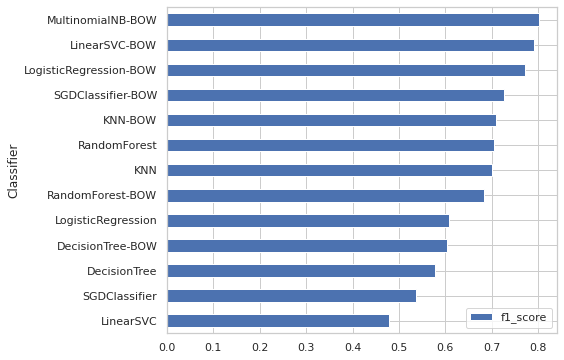

In [ ]:
log.sort_values(by=['f1_score']).plot(kind='barh',figsize=[7,6])

**Observation:** 
* Multinomial NB and Linear SVC have better performance but still are overfitted since the training accuracy is around 90% for most of the models and the testing accuracies, f1-scores are plotted above 
* We would be fine tuning the models and reduce the overfitting in next iteration.
* The performance can be further improved by collecting more data for tickets and by running deep learning models like RNN and LSTM's.

#### Data balancing using cosine distance comparison and SMOTE techniques

In [ ]:
inc_grp0 = incidents_clust[incidents_clust['Assignment group']=='GRP_0']
incidents_clust = incidents_clust[incidents_clust['Assignment group']!='GRP_0']
inc_grp0.reset_index(drop=True,inplace=True)

In [ ]:
print(inc_grp0.shape)
print(incidents_clust.shape)

(3926, 9)
(4031, 9)


In [ ]:
for i in range(100000):  #randomly choosing 100k iterations of comparison
  a=random.randint(0,inc_grp0.shape[0]-1)
  b=random.randint(0,inc_grp0.shape[0]-1)
  if (a!=b):
    if ((1-scipy.spatial.distance.cosine(inc_grp0.iloc[a]['embedding'],inc_grp0.iloc[b]['embedding'])) > 0.97):
      inc_grp0.drop(b, inplace=True)
      inc_grp0.reset_index(drop=True, inplace=True)

incidents_cosine = pd.concat([inc_grp0, incidents_clust])
print(incidents_cosine.shape)

/usr/local/lib/python3.6/dist-packages/scipy/spatial/distance.py:720: RuntimeWarning: invalid value encountered in double_scalars
  dist = 1.0 - uv / np.sqrt(uu * vv)


(4210, 9)


In [6]:
#with open('incidents_cosine.pickle', 'wb') as output:
#    pickle.dump(incidents_cosine, output)

with open('incidents_cosine.pickle', 'rb') as data:
    incidents_cosine = pickle.load(data)

In [ ]:
X1 = incidents_cosine['embedding'].values.tolist()
y1 = incidents_cosine['class']
X1 = np.array(X1)
y1 = np.array(y1)

In [ ]:
np.unique(y1)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [ ]:
oversample = SMOTE(k_neighbors=10)
X1, y1 = oversample.fit_resample(X1, y1)

undersample = RandomUnderSampler(random_state=42)
incidents_smote_data, incidents_smote_label = undersample.fit_resample(X1, y1)

In [ ]:
counter = Counter(incidents_smote_label)
print(counter)

Counter({0: 1224, 1: 1224, 2: 1224, 3: 1224, 4: 1224, 5: 1224, 6: 1224, 7: 1224, 8: 1224, 9: 1224})


In [7]:
with open('incidents_smote_data.pickle', 'rb') as data:
    incidents_smote_data = pickle.load(data)

with open('incidents_smote_label.pickle', 'rb') as data:
    incidents_smote_label = pickle.load(data)

#### Create training and test datasets

In [8]:
X_train, X_test, y_train, y_test = train_test_split(incidents_smote_data, incidents_smote_label, test_size=0.15, random_state=10)

In [ ]:
#Create a dataframe to capture the accuracy and f1-score of various models   
log_cols=["Classifier", "f1_score"]
log = pd.DataFrame(columns=log_cols)

### Classification Models on Glove embedding clusters

**Linear SVC**

In [ ]:
run_classification(OneVsRestClassifier(LinearSVC(loss='hinge',random_state=42,class_weight='balanced')), X_train, X_test, y_train, y_test, "LinearSVC")

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Estimator: OneVsRestClassifier(estimator=LinearSVC(C=1.0, class_weight='balanced',
                                        dual=True, fit_intercept=True,
                                        intercept_scaling=1, loss='hinge',
                                        max_iter=1000, multi_class='ovr',
                                        penalty='l2', random_state=42,
                                        tol=0.0001, verbose=0),
                    n_jobs=None)
Training accuracy: 54.64%
Testing accuracy: 51.80%
Confusion matrix:
 [[ 23   1  21  12  33  14   9  42  21   9]
 [ 11 137   4   2   9  11   3   3   6   0]
 [ 18   8  68   4  25  13  14  17  15   2]
 [  6   0   4 134   6   1  18  12   5   3]
 [ 13   3  24   5  90  17   9   9  15   2]
 [  9  37  25   6  18  46  14  18  12   0]
 [ 14   0  11  12   6  11 100  29  19   3]
 [ 18   0  10  14   2   0   3 109   7   0]
 [ 13   4  13   1  22   2   0   5 111   0]
 [  9   0   6   0   8   2   3   3  17 133]]
Classification report:
     

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


**SGD Classifier**

In [ ]:
run_classification(SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=100, tol=None,class_weight='balanced'), 
                   X_train, X_test, y_train, y_test, "SGDClassifier")

Estimator: SGDClassifier(alpha=0.001, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=100, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=42, shuffle=True, tol=None,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 44.13%
Testing accuracy: 43.90%
Confusion matrix:
 [[ 47  11   2  37   9   3  31  34   5   6]
 [ 34 126   1   3   3   3  10   2   2   2]
 [ 36  11  10  30  11  10  43  21   7   5]
 [  1   0   2 161   0   0  22   1   1   1]
 [ 59   6   4  11  38  14  41   7   6   1]
 [ 33  67   1  11   9  16  24  18   5   1]
 [ 17   0   2  34   0   3 136  12   1   0]
 [ 34   0   1  22   0   2  10  93   1   0]
 [ 56  13   5   2   5  15  22   1  52   0]
 [ 17   0   0   4   1   0  15   8   9 127]]
Classification report:
               precision    recall  f1-s

**Logistic Regression**

In [ ]:
run_classification(LogisticRegression(n_jobs=1, C=1e5,class_weight='balanced'), X_train, X_test, y_train, y_test, "LogisticRegression")

Estimator: LogisticRegression(C=100000.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=1, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 57.64%
Testing accuracy: 55.12%
Confusion matrix:
 [[ 32   1  24  15  31  10   8  34  22   8]
 [  9 141   4   1  10   7   2   2   9   1]
 [ 20  15  65   7  22   8  11  13  21   2]
 [  4   0   3 151   2   1  17   5   4   2]
 [ 17   4  16   4  96   7  13  11  18   1]
 [  7  43  20   5  21  37  15  20  17   0]
 [ 13   1  13  16   4   6 118  20  12   2]
 [ 16   0   8  17   5   1   4 103   9   0]
 [  7   7  11   2  15   0   0   1 128   0]
 [ 18   0   6   0   1   2   0   3  10 141]]
Classification report:
               precision    recall  f1-score   support

           0       0.22      0.17      0.20       185
           1       0.6

**Random Forest Classifier**

In [ ]:
run_classification(RandomForestClassifier(max_depth=15, random_state=0, class_weight="balanced"), X_train, X_test, y_train, y_test, "RandomForest")

Estimator: RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=0, verbose=0, warm_start=False)
Training accuracy: 96.35%
Testing accuracy: 80.94%
Confusion matrix:
 [[ 98   3  25  13  15   1   3  15  11   1]
 [  7 152   9   1   9   3   1   3   1   0]
 [ 25   8  96   7  17   7   6   7  10   1]
 [  4   0   5 176   0   1   1   1   1   0]
 [  5   2  10   0 162   0   4   1   3   0]
 [  2  27   8   0   6 131   4   3   3   1]
 [  5   0   6   2   3   0 181   4   4   0]
 [  1   0   5   0   0   1   0 153   3   0]
 [  1   0   2   0   1   0   0   2 165   0]
 [  4   0   2   0   1   0   0   1   1 172

**Decision Tree Classifier**

In [ ]:
run_classification(DecisionTreeClassifier(), X_train, X_test, y_train, y_test, "DecisionTree")

Estimator: DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
Training accuracy: 98.26%
Testing accuracy: 70.92%
Confusion matrix:
 [[ 76   8  23  10  19  11  16   5  10   7]
 [  6 148  11   5   8   2   2   1   2   1]
 [ 26  17  82   5  21   6   5   8   6   8]
 [  4   2  11 156   2   3   5   4   0   2]
 [ 12   6  19   5 127   1   8   4   5   0]
 [ 13  30  13   5  10 108   1   3   1   1]
 [  9   2  12   6   7   1 155   6   4   3]
 [  4   2   6   1   4   1   1 141   0   3]
 [  4   5   7   1   2   1   1   2 146   2]
 [  6   0   9   0   0   1   2   0   0 163]]
Classification report:
               precision    recall  f1-score   support

    

**K-Nearest Neighbours**

In [ ]:
run_classification(KNeighborsClassifier(n_neighbors= 5 , weights = 'distance'), X_train, X_test, y_train, y_test, "KNN")

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='distance')
Training accuracy: 96.52%
Testing accuracy: 83.06%
Confusion matrix:
 [[ 93   2  17   7  17  12  11  11   8   7]
 [  3  91   5   1   9  67   1   2   5   2]
 [ 15   6  84   3  26  15   8   2  23   2]
 [  1   0   0 187   0   0   0   0   1   0]
 [  3   0   2   0 179   0   0   0   3   0]
 [  0   2   2   0   1 179   1   0   0   0]
 [  0   0   0   0   1   0 202   0   2   0]
 [  0   0   1   0   0   0   0 162   0   0]
 [  0   0   0   0   0   0   0   0 171   0]
 [  1   0   1   0   0   0   0   1   1 177]]
Classification report:
               precision    recall  f1-score   support

           0       0.80      0.50      0.62       185
           1       0.90      0.49      0.63       186
           2       0.75      0.46      0.57       184
           3       0.94      0.99      0.97       189
     

In [ ]:
log.set_index(["Classifier"]).sort_values(by=['f1_score'])

,f1_score
Classifier,
SGDClassifier,0.466721
LinearSVC,0.525260
LogisticRegression,0.565186
DecisionTree,0.711666
RandomForest,0.813646
KNN,0.845709


**Observation:** 
* Random Forest and KNN have better performance but still are overfitted since the training accuracy is around 90% for most of the models and the f1-scores are plotted above 
* We would be fine tuning the models and reduce the overfitting in next iteration.
* The performance can be further improved by collecting more data for tickets and by running deep learning models like RNN and LSTM's.

## **Final Conclusions**
We first analysed the dataset provided to us, undestood the structure of the data provided - number of columns, field , datatypes etc.

> We first analysed the dataset provided to us, undestood the structure of the data provided - number of columns, field , datatypes etc.

> We did Exploratory Data Analysis to derive further insights from this data set and we found that
*   Data is very much imbalanced, there are around ~45% of the Groups with less than 20 tickets.
*   Few of the tickets are in foreign language like German
*   The data has lot of noise in it, for eg- few tickets related to account setup are spread across multiple assignment groups.

> We performed the data cleaning and preprocessing
*   Translation: A small number of tickets were written in German. Hence, we used the Google translate to convert German to English to generate the input data for the next steps. 
*   Make text all lowercase so that the algorithm does not treat the same words in different cases as different
*   Removing Noise i.e everything that isn’t in a standard number or letter i.e Punctuation, Numerical values
*   Removing extra spaces
*   Removed punctuations
*   Removed words containing numbers
*   Stopword Removal: Sometimes, some extremely common words which would appear to be of little value in helping select documents matching a user need are excluded from the vocabulary entirely. These words are called stop words
*   Lemmatization
*   Tokenization: Tokenization is just the term used to describe the process of converting the normal text strings into a list of tokens i.e words that we actually want. Sentence tokenizer can be used to find the list of sentences and Word tokenizer can be used to find the list of words in strings.

> We then performed topic modeling using LDA and NMF methods.

> Dimensionality reduction by T-sNE was performed.

> Clustering using hierarchical agglomerative clustering was performed to arrive at the different clusters and pseudo group of the assignment groups.

> We then ran a basic benchmarck model using the cleaned and preprocessed dataset. We focused only on the 38 groups above clustered into 10 classes for building various supervised machine learning models. Other clusters/classes have very less number of records for our model to understand and predict.
We trained the data using below models:
*   Multinomial NB
*   Linear Support vector Machine
*   SGD Classifier
*   Random Forest
*   Decision Tree
*   Logistic regression
*   Xgboost

LinearSVC gives better performance with accuracy 0.833642 f1 score 0.818053

Although, it seems like the call is biased towards GRP_0 which has a majority of samples.

Even after downsampling the data we see that the predictions are biased towards GRP_0 which has a majority of samples.
Imbalance causes two problems:
Training is inefficient as most samples are easy examples that contribute no useful learning signal;
The easy examples can overwhelm training and lead to degenerate models. A common solution is to perform some form of hard negative mining that samples hard examples during training or more complex sampling/re weighing schemes.In order to handle the imbalance problem we used class_weight=balanced hyperparameter while training the model, which tells the model to "pay more attention" to samples from an under-represented class.
Although, the accuracy and f1_score went down. This ensured that the classes were being correctly classified with lesser number of missclassification and good precision/recall scores for all the classes

## **Next Steps**

We could further improve the model by
*   Exploring more features out of the dataset
hyperparameter tuning using GridsearchCV,
*   try transfer learning with word embeddings and use that as a feature for modelling.
*   use neural network architecture like RNN or LSTM to improve model performance.
*   The performance can be further improved by collecting more data for tickets and by running deep learning models like RNN and LSTM's.

## KMeans clustering

In [ ]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.90, min_df =25, max_features=10000, use_idf=True)
tfidf_matrix = tfidf_vectorizer.fit_transform(incidents['tokens'])
incidents['tfidf'] =  list(tfidf_vectorizer.fit_transform(incidents['tokens']).toarray())
tfidf_matrix_arr = tfidf_matrix.toarray()
tfidf_feature_names = tfidf_vectorizer.get_feature_names()
doc_term_matrix_tfidf = pd.DataFrame(tfidf_matrix.todense(), columns=list(tfidf_feature_names))
doc_term_matrix_tfidf

,abende,able,accept,access,account,action,activate,activation,active,activity,ad,add,additional,address,admin,administrator,advise,aerp,affect,agent,alert,allow,already,also,alternate,amar,analysis,another,ap,apac,app,appear,application,approval,approve,area,asa,ask,assign,assignment,...,visitor,vlan,volume,von,vpn,want,warehouse,warm,warning,way,web,website,wednesday,week,welcome,well,wifi,win,window,windows,wireless,within,without,word,work,workflow,working,would,write,wrong,ws,www,yes,yesterday,µè,ºæ,å¼,æ³,æœ,çš
0,0.0,0.172378,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.217947,0.0,0.0,0.0,0.0,0.0,0.210423,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.244737,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.277269,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.478623,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.000000,0.0,0.382403,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8403,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.429138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8404,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8405,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.499522,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8406,0.0,0.000000,0.0,0.333324,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [ ]:
len(tfidf_matrix.todense())

8408

In [ ]:
num_clusters = 5
km = KMeans(n_clusters=num_clusters)
%time km.fit(tfidf_matrix)
clusters = km.labels_.tolist()
clusters = pd.DataFrame(clusters, columns=['Clusters'])
incidents_tfidf = pd.concat([incidents, clusters], axis=1)

CPU times: user 10.9 s, sys: 1.44 ms, total: 10.9 s
Wall time: 10.9 s


In [ ]:
incidents_tfidf.dropna(inplace=True)

In [ ]:
incidents_tfidf['Clusters'].value_counts()

0.0    4954
2.0    1465
1.0     919
3.0     612
4.0     366
Name: Clusters, dtype: int64

In [ ]:
incidents_tfidf.shape

(8316, 11)

In [ ]:
X = incidents_tfidf['tfidf'].values.tolist()
y = incidents_tfidf['Clusters']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=10)

"""vectorizer, vocab, train_data_features, tfidf_features, tfidf  =  create_bag_of_words(incidents_tfidf['tokens'])
test_data_features = vectorizer.transform(X_test)
test_data_features = test_data_features.toarray()   # Convert to numpy array
test_data_tfidf_features = tfidf.fit_transform(test_data_features)
test_data_tfidf_features = test_data_tfidf_features.toarray()    # Convert to numpy array
"""
#Create a dataframe to capture the accuracy and f1-score of various models   
log_cols=["Embeddings", "Classifier", "Precision", "Recall", "Accuracy", "f1_score", "Latency"]
log1 = pd.DataFrame(columns=log_cols)

In [ ]:
test_data_tfidf_features[0].shape

(10000,)

In [ ]:
# A class that logs the time
class Timer():
    '''
    A generic class to log the time
    '''
    def __init__(self):
        self.start_ts = None
    def start(self):
        self.start_ts = time()
    def stop(self):
        return 'Time taken: %2fs' % (time()-self.start_ts)
    
timer = Timer()

# A method that plots the Precision-Recall curve
def plot_prec_recall_vs_thresh(precisions, recalls, thresholds):
    plt.figure(figsize=(10,5))
    plt.plot(thresholds, precisions[:-1], 'b--', label='precision')
    plt.plot(thresholds, recalls[:-1], 'g--', label = 'recall')
    plt.xlabel('Threshold')
    plt.legend()

# A method to train and test the model
def run_classification(estimator, X_train, X_test, y_train, y_test, ename, clfname, arch_name=None, pipelineRequired=False, isDeepModel=False):
    global log1
    timer.start()
    # train the model
    clf = estimator
    modelname = clfname
    embedname = ename
   
    if pipelineRequired :
        clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
        clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=10, batch_size=128,verbose=1,callbacks=call_backs(arch_name))
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)
    else :
        clf.fit(X_train, y_train)
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
    
    print('Estimator:', clf)
    print('='*80)
    print('Training accuracy: %.2f%%' % (accuracy_score(y_train,y_train_pred) * 100))
    print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, y_pred) * 100))
    print('='*80)
    print('Confusion matrix:\n %s' % (confusion_matrix(y_test, y_pred)))
    print('='*80)
    print('Classification report:\n %s' % (classification_report(y_test, y_pred)))
    print(timer.stop(), 'to run the model')
    time_taken=timer.stop()
    log_entry = pd.DataFrame([[embedname,modelname,precision_score(y_pred, y_test,average='weighted'),recall_score(y_pred, y_test,average='weighted'),
                               accuracy_score(y_pred, y_test),f1_score(y_pred, y_test,average='weighted'),time_taken]], columns=log_cols)
    log1 = log1.append(log_entry)

**Multinomial Naive Bayes**

In [ ]:
run_classification(MultinomialNB(), X_train, X_test, y_train, y_test,"TFIDF & K-Means", "Vanilla MultinomialNB")

Estimator: MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)
Training accuracy: 68.26%
Testing accuracy: 66.21%
Confusion matrix:
 [[732   0   0   0   0]
 [ 58   0   0   0   1]
 [137   0   0   0   0]
 [105   1   0   0   0]
 [ 72   0   0   0   1]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.66      1.00      0.80       732
         1.0       0.00      0.00      0.00        59
         2.0       0.00      0.00      0.00       137
         3.0       0.00      0.00      0.00       106
         4.0       0.50      0.01      0.03        73

    accuracy                           0.66      1107
   macro avg       0.23      0.20      0.16      1107
weighted avg       0.47      0.66      0.53      1107

Time taken: 0.102224s to run the model


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


**LinearSVC**

In [ ]:
run_classification(OneVsRestClassifier(LinearSVC()), X_train, X_test, y_train, y_test, "TFIDF & K-Means", "Vanilla LinearSVC")

Estimator: OneVsRestClassifier(estimator=LinearSVC(C=1.0, class_weight=None, dual=True,
                                        fit_intercept=True, intercept_scaling=1,
                                        loss='squared_hinge', max_iter=1000,
                                        multi_class='ovr', penalty='l2',
                                        random_state=None, tol=0.0001,
                                        verbose=0),
                    n_jobs=None)
Training accuracy: 69.61%
Testing accuracy: 65.31%
Confusion matrix:
 [[720   0   6   3   3]
 [ 59   0   0   0   0]
 [135   0   2   0   0]
 [106   0   0   0   0]
 [ 71   0   1   0   1]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.66      0.98      0.79       732
         1.0       0.00      0.00      0.00        59
         2.0       0.22      0.01      0.03       137
         3.0       0.00      0.00      0.00       106
         4.0       0.25      0.01      0.03 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


**SGD Classifier**

In [ ]:
run_classification(SGDClassifier(), X_train, X_test, y_train, y_test, "TFIDF & K-Means", "Vanilla SGDClassifier")

Estimator: SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 68.54%
Testing accuracy: 66.12%
Confusion matrix:
 [[732   0   0   0   0]
 [ 59   0   0   0   0]
 [137   0   0   0   0]
 [106   0   0   0   0]
 [ 73   0   0   0   0]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.66      1.00      0.80       732
         1.0       0.00      0.00      0.00        59
         2.0       0.00      0.00      0.00       137
         3.0       0.00      0.00      0.00       106
         4.0       0.00      0.00      0.00        73

    accuracy                 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


**Logistic Regression**

In [ ]:
run_classification(LogisticRegression(), X_train, X_test, y_train, y_test, "TFIDF & K-Means", "Vanilla LogisticRegression")

Estimator: LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 68.46%
Testing accuracy: 66.03%
Confusion matrix:
 [[731   0   1   0   0]
 [ 59   0   0   0   0]
 [137   0   0   0   0]
 [106   0   0   0   0]
 [ 73   0   0   0   0]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.66      1.00      0.80       732
         1.0       0.00      0.00      0.00        59
         2.0       0.00      0.00      0.00       137
         3.0       0.00      0.00      0.00       106
         4.0       0.00      0.00      0.00        73

    accuracy                           0.66      1107
   macro avg       0.13      0.20      0.16      1107
weighted avg       0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


**Random Forest Classifier**

In [ ]:
le = LabelEncoder()
tokenizer = Tokenizer(num_words= 10000)
tokenizer.fit_on_texts(incidents_tfidf['tokens'])
maxlen = 720

X_M1 = tokenizer.texts_to_sequences(incidents_clust['tokens'])
X_M1 = pad_sequences(X_M1, maxlen = maxlen)
y_M1 = np.asarray(incidents_clust['class'])

X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_M1, y_M1, test_size = 0.3)

run_classification(RandomForestClassifier(), X_train, X_test, y_train, y_test, "TFIDF & K-Means", "Vanilla RandomForest")

Estimator: RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Training accuracy: 91.26%
Testing accuracy: 62.60%
Confusion matrix:
 [[688  13  13   7  11]
 [ 55   0   1   2   1]
 [128   1   5   2   1]
 [101   1   2   0   2]
 [ 67   0   6   0   0]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.66      0.94      0.78       732
         1.0       0.00      0.00      0.00        59
         2.0       0.19      0.04      0.06       137
         3.0       0.00      0.00      0.00       106
         4.0      

**Decision Tree Classifier**

In [ ]:
run_classification(DecisionTreeClassifier(), X_train, X_test, y_train, y_test, "TFIDF & K-Means", "Vanilla DecisionTree")

Estimator: DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
Training accuracy: 93.96%
Testing accuracy: 53.93%
Confusion matrix:
 [[575  21  66  49  21]
 [ 48   3   5   1   2]
 [113   1  12   6   5]
 [ 88   4   7   4   3]
 [ 58   0   9   3   3]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.65      0.79      0.71       732
         1.0       0.10      0.05      0.07        59
         2.0       0.12      0.09      0.10       137
         3.0       0.06      0.04      0.05       106
         4.0       0.09      0.04      0.06        73

    accuracy                           0.54     

**K-Nearest Neighbours**

In [ ]:
run_classification(KNeighborsClassifier(), X_train, X_test, y_train, y_test, "TFIDF & K-Means", "Vanilla KNN")

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')
Training accuracy: 69.72%
Testing accuracy: 64.95%
Confusion matrix:
 [[715   1   9   5   2]
 [ 58   0   1   0   0]
 [133   0   3   1   0]
 [105   0   0   1   0]
 [ 72   0   0   1   0]]
Classification report:
               precision    recall  f1-score   support

         0.0       0.66      0.98      0.79       732
         1.0       0.00      0.00      0.00        59
         2.0       0.23      0.02      0.04       137
         3.0       0.12      0.01      0.02       106
         4.0       0.00      0.00      0.00        73

    accuracy                           0.65      1107
   macro avg       0.20      0.20      0.17      1107
weighted avg       0.48      0.65      0.53      1107

Time taken: 62.237478s to run the model


In [ ]:
log1.set_index(["Embeddings"])
log1.sort_values(by=['f1_score', 'Latency'])

,Embeddings,Classifier,Precision,Recall,Accuracy,f1_score,Latency
0,TFIDF & K-Means,Vanilla DecisionTree,0.638436,0.539295,0.539295,0.582992,Time taken: 10.282752s
0,TFIDF & K-Means,Vanilla RandomForest,0.883046,0.626016,0.626016,0.730723,Time taken: 2.386557s
0,TFIDF & K-Means,Vanilla KNN,0.955925,0.649503,0.649503,0.771394,Time taken: 62.237530s
0,TFIDF & K-Means,Vanilla LinearSVC,0.969558,0.653117,0.653117,0.778806,Time taken: 0.446239s
0,TFIDF & K-Means,Vanilla LogisticRegression,0.997732,0.660343,0.660343,0.794711,Time taken: 0.196292s
0,TFIDF & K-Means,Vanilla MultinomialNB,0.997315,0.662150,0.662150,0.795273,Time taken: 0.102279s
0,TFIDF & K-Means,Vanilla SGDClassifier,1.000000,0.661247,0.661247,0.796085,Time taken: 1.881425s


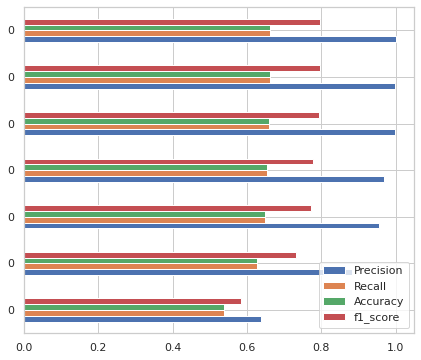

In [ ]:
log1.sort_values(by=['f1_score','Latency']).plot(kind='barh',figsize=[7,6])

Observation:

* Multinomial NB and Random Forest have better performance but still are overfitted since the training accuracy is around 90% for most of the models and the testing accuracies, f1-scores are plotted above
* We would be fine tuning the models and reduce the overfitting in next iteration.
* The performance can be further improved by collecting more data for tickets and by running deep learning models like RNN and LSTM's.

## Hyperparameter Tuning

**Linear SVC**

In [ ]:
# define model and parameters
model = LinearSVC()
penalty = ['l1', 'l2']
loss = ['hinge', 'squared_hinge']
class_weight = ['dict', 'balanced']
C = [50, 10, 1.0, 0.1, 0.01]

# define grid search
grid = dict(penalty=penalty,loss=loss,class_weight=class_weight,C=C)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.560866 using {'C': 10, 'class_weight': 'balanced', 'loss': 'squared_hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l1'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'l1'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'hinge', 'penalty': 'l1'}
0.450463 (0.027235) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'squared_hinge', 'penalty': 'l1'}
0.418301 (0.071184) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'squared_hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 10, 'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l1'}
0.000

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


**SGD Classifier**

In [ ]:
# define model and parameters
model = SGDClassifier()
penalty = ['l1', 'l2','elasticnet']
loss = ['hinge', 'squared_hinge', 'modified_huber']
class_weight = ['dict', 'balanced']

# define grid search
grid = dict(penalty=penalty,loss=loss,class_weight=class_weight)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

KeyboardInterrupt: ignored

**Logistic Regression**

In [ ]:
# define models and parameters
model = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

**Random Forest**

In [ ]:
# define models and parameters
model = RandomForestClassifier()
n_estimators = [10, 100, 1000]
max_features = ['sqrt', 'log2']
# define grid search
grid = dict(n_estimators=n_estimators,max_features=max_features)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
f1_samples = make_scorer(f1_score, average='macro')
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Best: 0.876484 using {'max_features': 'log2', 'n_estimators': 1000}
0.819350 (0.006027) with: {'max_features': 'sqrt', 'n_estimators': 10}
0.871324 (0.006344) with: {'max_features': 'sqrt', 'n_estimators': 100}
0.876443 (0.005114) with: {'max_features': 'sqrt', 'n_estimators': 1000}
0.817163 (0.007622) with: {'max_features': 'log2', 'n_estimators': 10}
0.871506 (0.006589) with: {'max_features': 'log2', 'n_estimators': 100}
0.876484 (0.005831) with: {'max_features': 'log2', 'n_estimators': 1000}


**Decision Tree**

In [ ]:
# define models and parameters
model = DecisionTreeClassifier()
criterion = ['gini', 'entropy']
max_features = ['auto', 'sqrt', 'log2']
class_weight = ['dict', 'balanced']

# define grid search
grid = dict(criterion=criterion,max_features=max_features,class_weight=class_weight)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.699708 using {'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'gini', 'max_features': 'auto'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'gini', 'max_features': 'sqrt'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'gini', 'max_features': 'log2'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'entropy', 'max_features': 'auto'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'entropy', 'max_features': 'sqrt'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'entropy', 'max_features': 'log2'}
0.697774 (0.011075) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'auto'}
0.695510 (0.009198) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'sqrt'}
0.692874 (0.008378) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'log2'}
0.699043 (0.00934

**KNN**

In [ ]:
# define models and parameters
model = KNeighborsClassifier()
n_neighbors = range(1, 21, 5)
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
# define grid search
grid = dict(n_neighbors=n_neighbors,weights=weights,metric=metric)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.863904 using {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
0.863904 (0.014968) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
0.863904 (0.014968) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'distance'}
0.800437 (0.011770) with: {'metric': 'euclidean', 'n_neighbors': 6, 'weights': 'uniform'}
0.830639 (0.012659) with: {'metric': 'euclidean', 'n_neighbors': 6, 'weights': 'distance'}
0.745980 (0.012094) with: {'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'uniform'}
0.794130 (0.015078) with: {'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'distance'}
0.714238 (0.011056) with: {'metric': 'euclidean', 'n_neighbors': 16, 'weights': 'uniform'}
0.775299 (0.013741) with: {'metric': 'euclidean', 'n_neighbors': 16, 'weights': 'distance'}
0.863814 (0.015738) with: {'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'uniform'}
0.863814 (0.015738) with: {'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'distance'}
0.7990

### Fit the models with tuned hyperparameters

In [10]:
#Create a dataframe to capture the accuracy and f1-score of various models   
log_cols=["Embeddings", "Classifier", "Precision", "Recall", "Accuracy", "f1_score", "Latency"]
log_hyper = pd.DataFrame(columns=log_cols)

##### Create a function for various classification models

In [11]:
# A class that logs the time
class Timer():
    '''
    A generic class to log the time
    '''
    def __init__(self):
        self.start_ts = None
    def start(self):
        self.start_ts = time()
    def stop(self):
        return 'Time taken: %2fs' % (time()-self.start_ts)
    
timer = Timer()

# A method that plots the Precision-Recall curve
def plot_prec_recall_vs_thresh(precisions, recalls, thresholds):
    plt.figure(figsize=(10,5))
    plt.plot(thresholds, precisions[:-1], 'b--', label='precision')
    plt.plot(thresholds, recalls[:-1], 'g--', label = 'recall')
    plt.xlabel('Threshold')
    plt.legend()

# A method to train and test the model
def run_classification_hyper(estimator, X_train, X_test, y_train, y_test, ename, clfname, arch_name=None, pipelineRequired=False, isDeepModel=False):
    global log_hyper
    timer.start()
    # train the model
    clf = estimator
    modelname = clfname
    embedname = ename
   
    if pipelineRequired :
        clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
        clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=10, batch_size=128,verbose=1,callbacks=call_backs(arch_name))
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)
    else :
        clf.fit(X_train, y_train)
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
    
    print('Estimator:', clf)
    print('='*80)
    print('Training accuracy: %.2f%%' % (accuracy_score(y_train,y_train_pred) * 100))
    print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, y_pred) * 100))
    print('='*80)
    print('Confusion matrix:\n %s' % (confusion_matrix(y_test, y_pred)))
    print('='*80)
    print('Classification report:\n %s' % (classification_report(y_test, y_pred)))
    print(timer.stop(), 'to run the model')
    time_taken=timer.stop()
    log_entry = pd.DataFrame([[embedname,modelname,precision_score(y_pred, y_test,average='weighted'),recall_score(y_pred, y_test,average='weighted'),
                               accuracy_score(y_pred, y_test),f1_score(y_pred, y_test,average='weighted'),time_taken]], columns=log_cols)
    log_hyper = log_hyper.append(log_entry)


**Linear SVC**

In [12]:
run_classification_hyper(OneVsRestClassifier(LinearSVC(C=0.01, class_weight='balanced', dual=True, 
                                                                 fit_intercept=True, intercept_scaling=1,
                                                                 loss='squared_hinge', max_iter=1000,
                                                                 multi_class='ovr', penalty='l2',
                                                                 random_state=None, tol=0.0001,
                                                                 verbose=0), 
                                             n_jobs=None), X_train, X_test, y_train, y_test, "Glove & Agglomerative (balanced clusters)", "Hypertuned LinearSVC")

Estimator: OneVsRestClassifier(estimator=LinearSVC(C=0.01, class_weight='balanced',
                                        dual=True, fit_intercept=True,
                                        intercept_scaling=1,
                                        loss='squared_hinge', max_iter=1000,
                                        multi_class='ovr', penalty='l2',
                                        random_state=None, tol=0.0001,
                                        verbose=0),
                    n_jobs=None)
Training accuracy: 51.62%
Testing accuracy: 51.09%
Confusion matrix:
 [[ 30  10  25   7  22   7  21  35  22   6]
 [  7 138   9   1  11   7   4   4   4   1]
 [ 15   8  52  14  28  14  13  16  21   3]
 [  5   1   5 140   4   0  17   9   7   1]
 [ 14   0  32   4  93   4  15  11  14   0]
 [  5  38  24   6  24  44   7  19  18   0]
 [ 15   0  16   9  28   2 102  21  11   1]
 [ 16   0   9   8   6   0   0 120   4   0]
 [  9   4  22   4  31   2   2   7  90   0]
 [ 11   0   9   0  10

**SGD Classifier**

In [13]:
run_classification_hyper(SGDClassifier(alpha=0.0001, average=False, class_weight='balanced', 
                                       early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
                                       l1_ratio=0.15, learning_rate='optimal', loss='hinge',
                                       max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
                                       power_t=0.5, random_state=None, shuffle=True, tol=0.001,
                                       validation_fraction=0.1, verbose=0, warm_start=False), X_train, X_test, y_train, y_test, "Glove & Agglomerative (balanced clusters)", "Hypertuned SGDClassifier")

Estimator: SGDClassifier(alpha=0.0001, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 51.17%
Testing accuracy: 50.27%
Confusion matrix:
 [[ 29   6   0  11  20   7  10  54  43   5]
 [  7 127   0   2  12   1   3   3  31   0]
 [ 29   7   0  15  34   9  13  29  47   1]
 [  4   0   0 147   1   0  15  13   8   1]
 [ 18   1   0   3  92   6   8  17  42   0]
 [  7  38   0   4  26  43   6  28  33   0]
 [ 22   0   0   9  20   3  97  27  26   1]
 [ 12   0   0  10   7   1   2 122   9   0]
 [  3   0   0   3  17   0   0   7 141   0]
 [ 26   0   0   0   5   5   1   7  12 125]]
Classification report:
               precision    recall 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


**Logistic Regression**

In [14]:
run_classification_hyper(LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                                            intercept_scaling=1, l1_ratio=None, max_iter=100,
                                            multi_class='auto', n_jobs=None, penalty='l2',
                                            random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                                            warm_start=False), X_train, X_test, y_train, y_test, "Glove & Agglomerative (balanced clusters)",  "Hypertuned LogisticRegression")

Estimator: LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 54.60%
Testing accuracy: 54.14%
Confusion matrix:
 [[ 33   8  19   9  17   6  20  35  27  11]
 [  9 143   4   3  11   3   2   3   7   1]
 [ 17  10  58  14  20   7  16  17  22   3]
 [  4   0   5 148   2   1  17   6   5   1]
 [ 15   2  23   5  91   6  23   8  14   0]
 [  3  41  17   5  22  41  12  21  23   0]
 [ 20   0  13  14  10   2 115  20  10   1]
 [ 18   0   4  12   2   0   3 120   4   0]
 [  8   3  19   5  18   1   1   6 110   0]
 [ 15   0   8   0   3   1   3   7   9 135]]
Classification report:
               precision    recall  f1-score   support

           0       0.23      0.18      0.20       185
           1       0.69  

**Random Forest Classifier**

In [15]:
run_classification_hyper(RandomForestClassifier(bootstrap=True, class_weight=None,
                                                criterion='gini', max_depth=None, max_features='log2',
                                                max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None,
                                                min_samples_leaf=1, min_samples_split=2,
                                                min_weight_fraction_leaf=0.0, n_estimators=1000,
                                                n_jobs=None, oob_score=False, random_state=None,
                                                verbose=0, warm_start=False), X_train, X_test, y_train, y_test, "Glove & Agglomerative (balanced clusters)", "Hypertuned RandomForest")

Estimator: RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Training accuracy: 98.32%
Testing accuracy: 88.07%
Confusion matrix:
 [[118   2  27   6  12   2  11   0   5   2]
 [  8 150  13   1  10   1   0   2   1   0]
 [ 23   7 119   7  15   0   6   2   5   0]
 [  2   0   1 183   0   0   1   0   2   0]
 [  0   0   0   0 186   0   1   0   0   0]
 [  3  26   1   0   1 150   1   1   2   0]
 [  0   0   0   0   0   0 204   0   1   0]
 [  0   0   2   0   0   0   0 160   1   0]
 [  0   0   0   0   0   0   0   0 171   0]
 [  2   0   2   0   1   0   0   0   0 17

**Decision Tree Classifier**

In [16]:
run_classification_hyper(DecisionTreeClassifier(class_weight='balanced', criterion='entropy', 
                                                max_depth=None, max_features='sqrt', max_leaf_nodes=None,
                                                min_impurity_decrease=0.0, min_impurity_split=None,
                                                min_samples_leaf=1, min_samples_split=2,
                                                min_weight_fraction_leaf=0.0,
                                                random_state=None, splitter='best'), X_train, X_test, y_train, y_test, "Glove & Agglomerative (balanced clusters)", "Hypertuned DecisionTree")

Estimator: DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=None, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
Training accuracy: 98.32%
Testing accuracy: 71.68%
Confusion matrix:
 [[ 84   2  30  10  16  12   8   7  11   5]
 [ 10 148   9   1   9   4   1   1   3   0]
 [ 28  11  79   8  15  12  10   4  10   7]
 [  6   5   6 156   2   0   6   4   2   2]
 [ 11   5  10   3 132   7   6   4   6   3]
 [  6  30   3   1   5 121   6   4   7   2]
 [  6   2   9   9   6   7 156   2   5   3]
 [  5   3   5   3   3   2   6 134   2   0]
 [  1   2  10   0   3   2   0   2 149   2]
 [ 12   3   5   1   1   1   0   1   0 157]]
Classification report:
               precision    recall  f1-score   su

**K-Nearest Neighbours**

In [17]:
run_classification_hyper(KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                                              metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                                              weights='uniform'), X_train, X_test, y_train, y_test, "Glove & Agglomerative (balanced clusters)", "Hypertuned KNN")

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')
Training accuracy: 98.28%
Testing accuracy: 87.96%
Confusion matrix:
 [[122   5  11   3  10   7  12   5   5   5]
 [  5 150  11   0   8   6   1   3   2   0]
 [ 12  17 101   4  15  12   9   1  13   0]
 [  0   0   0 186   1   0   0   1   1   0]
 [  0   0   0   0 186   1   0   0   0   0]
 [  2  27   1   0   0 155   0   0   0   0]
 [  0   0   0   0   0   0 205   0   0   0]
 [  0   0   0   0   2   0   0 161   0   0]
 [  0   0   0   0   0   0   0   0 171   0]
 [  0   0   1   0   2   0   0   0   0 178]]
Classification report:
               precision    recall  f1-score   support

           0       0.87      0.66      0.75       185
           1       0.75      0.81      0.78       186
           2       0.81      0.55      0.65       184
           3       0.96      0.98      0.97       189
      

In [10]:
knc_model = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean', metric_params=None, n_jobs=None, n_neighbors=1, p=2, weights='uniform')
knc_model.fit(X_train, y_train)

filename = 'finalized_model.pickle'
pickle.dump(knc_model, open(filename, 'wb'))

loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(X_test, y_test)
print(result)

0.8796296296296297


In [18]:
# add the hyper parameter details to the log table
                                     
log_hyper.loc[log_hyper['Classifier']=='Hypertuned RandomForest','Best Hyper Parameters'] = 'max_features=log2, n_estimators=1000'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned DecisionTree','Best Hyper Parameters'] = 'class_weight=balanced, criterion=entropy,max_features=sqrt'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned KNN','Best Hyper Parameters'] = 'metric=euclidean, n_neighbors=1, weights=uniform'

log_hyper

,Embeddings,Classifier,Precision,Recall,Accuracy,f1_score,Latency,Best Hyper Parameters
0,Glove & Agglomerative (balanced clusters),Hypertuned LinearSVC,0.543345,0.510893,0.510893,0.517213,Time taken: 3.780194s,NaN
0,Glove & Agglomerative (balanced clusters),Hypertuned SGDClassifier,0.629767,0.502723,0.502723,0.531604,Time taken: 4.235494s,NaN
0,Glove & Agglomerative (balanced clusters),Hypertuned LogisticRegression,0.586417,0.541394,0.541394,0.554438,Time taken: 8.854374s,NaN
0,Glove & Agglomerative (balanced clusters),Hypertuned RandomForest,0.893224,0.880719,0.880719,0.884241,Time taken: 100.193643s,"max_features=log2, n_estimators=1000"
0,Glove & Agglomerative (balanced clusters),Hypertuned DecisionTree,0.725562,0.716776,0.716776,0.720074,Time taken: 1.112806s,"class_weight=balanced, criterion=entropy,max_f..."
0,Glove & Agglomerative (balanced clusters),Hypertuned KNN,0.901055,0.879630,0.879630,0.885882,Time taken: 6.148761s,"metric=euclidean, n_neighbors=1, weights=uniform"


In [19]:
log_hyper.set_index(["Embeddings"])
log_hyper.sort_values(by=['f1_score', 'Latency'])

,Embeddings,Classifier,Precision,Recall,Accuracy,f1_score,Latency,Best Hyper Parameters
0,Glove & Agglomerative (balanced clusters),Hypertuned LinearSVC,0.543345,0.510893,0.510893,0.517213,Time taken: 3.780194s,NaN
0,Glove & Agglomerative (balanced clusters),Hypertuned SGDClassifier,0.629767,0.502723,0.502723,0.531604,Time taken: 4.235494s,NaN
0,Glove & Agglomerative (balanced clusters),Hypertuned LogisticRegression,0.586417,0.541394,0.541394,0.554438,Time taken: 8.854374s,NaN
0,Glove & Agglomerative (balanced clusters),Hypertuned DecisionTree,0.725562,0.716776,0.716776,0.720074,Time taken: 1.112806s,"class_weight=balanced, criterion=entropy,max_f..."
0,Glove & Agglomerative (balanced clusters),Hypertuned RandomForest,0.893224,0.880719,0.880719,0.884241,Time taken: 100.193643s,"max_features=log2, n_estimators=1000"
0,Glove & Agglomerative (balanced clusters),Hypertuned KNN,0.901055,0.879630,0.879630,0.885882,Time taken: 6.148761s,"metric=euclidean, n_neighbors=1, weights=uniform"


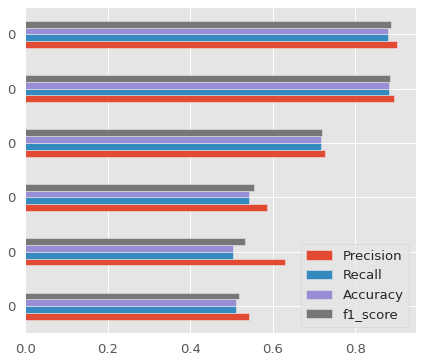

In [20]:
log_hyper.sort_values(by=['f1_score','Latency']).plot(kind='barh',figsize=[7,6])

In [ ]:
tfidfk_log = pd.concat([log1, log_hyper])
tfidfk_log.sort_values(by=['f1_score', 'Latency'])

NameError: ignored

##Prediction using Bert Model

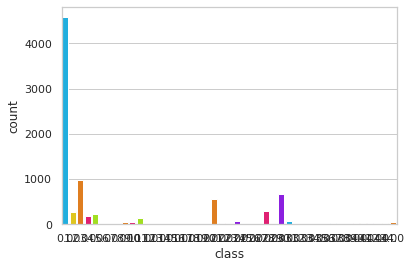

In [ ]:
chart = sns.countplot(incidents['class'], palette=HAPPY_COLORS_PALETTE)

Jaccard similarity is a raw method of determing similarity between sentences. It only considers the lexical representation and ignores the semantic representation. In simpler terms, it will look for common words but doesn't consider synonyms since it doesn't understand the meaning of words.

In [ ]:
def jaccard_similarity(query, document):
    intersection = set(query).intersection(set(document))
    union = set(query).union(set(document))
    return len(intersection)/len(union)

In [ ]:
## Sample
sent1= "AI is our friend and it has been friendly"
sent2= "AI and humans have always been friendly"
jaccard_similarity(sent1,sent2)

0.7619047619047619

Let us try a different type of comparison. Instead of tokens, let us use the embeddings and distance metrics such as cosine similarity.

In [27]:
!wget https://storage.googleapis.com/bert_models/2018_10_18/uncased_L-12_H-768_A-12.zip

--2020-09-03 21:01:14--  https://storage.googleapis.com/bert_models/2018_10_18/uncased_L-12_H-768_A-12.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 172.217.193.128, 172.217.204.128, 172.217.203.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.217.193.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 407727028 (389M) [application/zip]
Saving to: ‘uncased_L-12_H-768_A-12.zip’

uncased_L-12_H-768_ 100%[===================>] 388.84M  42.9MB/s    in 7.9s    

2020-09-03 21:01:22 (49.2 MB/s) - ‘uncased_L-12_H-768_A-12.zip’ saved [407727028/407727028]



In [28]:
!unzip uncased_L-12_H-768_A-12.zip

Archive:  uncased_L-12_H-768_A-12.zip
   creating: uncased_L-12_H-768_A-12/
  inflating: uncased_L-12_H-768_A-12/bert_model.ckpt.meta  
  inflating: uncased_L-12_H-768_A-12/bert_model.ckpt.data-00000-of-00001  
  inflating: uncased_L-12_H-768_A-12/vocab.txt  
  inflating: uncased_L-12_H-768_A-12/bert_model.ckpt.index  
  inflating: uncased_L-12_H-768_A-12/bert_config.json  


In [29]:
os.makedirs('model', exist_ok=True)

In [30]:
!mv uncased_L-12_H-768_A-12/ model

In [31]:
bert_model_name = 'uncased_L-12_H-768_A-12'
bert_ckpt_dir = os.path.join('model/',bert_model_name)
bert_ckpt_file = os.path.join(bert_ckpt_dir, 'bert_model.ckpt')
bert_config_file = os.path.join(bert_ckpt_dir, 'bert_config.json')

In [32]:
bert_ckpt_file

'model/uncased_L-12_H-768_A-12/bert_model.ckpt'

In [23]:
inc_bert = incidents[['tokens','Assignment group']]
inc_bert.head(2)

,tokens,Assignment group
0,verify user detail employee manager name check...,GRP_0
1,receive hmjdrvpb komuaywn gmail com hello team...,GRP_0


In [ ]:
tokenizer = FullTokenizer(vocab_file = os.path.join(bert_ckpt_dir, 'vocab.txt'))
tokens = tokenizer.tokenize("hello guys, my first project is great!")
tokenizer.convert_tokens_to_ids(tokens)

[7592, 4364, 1010, 2026, 2034, 2622, 2003, 2307, 999]

In [ ]:
max_len_param = 300
max_seq_len = 0

x = []
for i in inc_bert['tokens']:
  tokens = tokenizer.tokenize(i)
  tokens = ["[CLS]"] + tokens + ["[SEP]"]
  token_ids = tokenizer.convert_tokens_to_ids(tokens)
  max_seq_len = max(max_seq_len, len(token_ids))
  x.append(token_ids)

ids = np.array(x)
max_seq_len = min(max_seq_len, max_len_param)

x = []
for i in ids:
  cut_point = min(len(i), max_seq_len - 2)
  i = i[:cut_point]
  i = i + [0] * (max_seq_len - len(i))
  x.append(np.array(i))

embedding = np.array(x)


In [ ]:
inc_bert['embeds'] = embedding.tolist()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
inc_bert.head()

,tokens,Assignment group,embeds
0,verify user detail employee manager name check...,GRP_0,"[101, 20410, 5310, 6987, 7904, 3208, 2171, 463..."
1,receive hmjdrvpb komuaywn gmail com hello team...,GRP_0,"[101, 4374, 20287, 3501, 13626, 2615, 2361, 24..."
2,receive eylqgodm ybqkwiam gmail com hi log vpn...,GRP_0,"[101, 4374, 1041, 8516, 4160, 3995, 22117, 106..."
3,unable access hr tool page,GRP_0,"[101, 4039, 3229, 17850, 6994, 3931, 102, 0, 0..."
4,skype error,GRP_0,"[101, 3712, 5051, 7561, 102, 0, 0, 0, 0, 0, 0,..."


Since group 0 constitutes half of the records, let us handle them separately.

In [ ]:
inc_grp0 = inc_bert[inc_bert['Assignment group']=='GRP_0']
inc_bert = inc_bert[inc_bert['Assignment group']!='GRP_0']

In [ ]:
print(inc_bert.shape)
print(inc_grp0.shape)

In [ ]:
inc_grp0.reset_index(drop=True,inplace=True)
inc_grp0.index

Since we have collected embeddings, we can use comparison techniques. Let us try cosine distance in comparison to jaccard similarity illustrated on top already.

In [ ]:
#Let us consider preprocessed sentences for comparison
sent1= "AI is our friend and it has been friend"
sent2= "AI and humans has always been friend"
sent3= "Obama speaks media Illinois"
sent4= "president greets press Chicago"

In [ ]:
import scipy
import random

print('Similarity between sentences 1 and 2:-')
print('cosine metric:',1 - scipy.spatial.distance.cosine(tokenizer.convert_tokens_to_ids(tokenizer.tokenize(sent1)),tokenizer.convert_tokens_to_ids(tokenizer.tokenize(sent2))+[0]*2))
print('Jaccard similarity:',jaccard_similarity(sent1,sent2))

print('Similarity between sentences 3 and 4:-')
print('cosine metric:',1 - scipy.spatial.distance.cosine(tokenizer.convert_tokens_to_ids(tokenizer.tokenize(sent3))+[0]*1,tokenizer.convert_tokens_to_ids(tokenizer.tokenize(sent4))))
print('Jaccard similarity:',jaccard_similarity(sent3,sent4))

We could see that Jaccard identifies the first 2 sentences as similar successfully, but failed in the next 2 sentences because there is no lexical match though semantically similar.

In [ ]:

for i in range(100000):  #randomly choosing 100k iterations of comparison
  a=random.randint(0,inc_grp0.shape[0]-1)
  b=random.randint(0,inc_grp0.shape[0]-1)
  if (a!=b):
    if ((1-scipy.spatial.distance.cosine(inc_grp0.iloc[a]['embeds'],inc_grp0.iloc[b]['embeds'])) > 0.6):
      inc_grp0.drop(b, inplace=True)
      inc_grp0.reset_index(drop=True, inplace=True)


In [ ]:
print(inc_grp0.shape)

(307, 3)


We have reduced number of records for GRP_0 from 3968 to around 250 and also they must be covering records which are more dissimilar and specific in nature.

In [ ]:
inc_bert = pd.concat([inc_grp0, inc_bert])
print(inc_bert.shape)

(4830, 3)


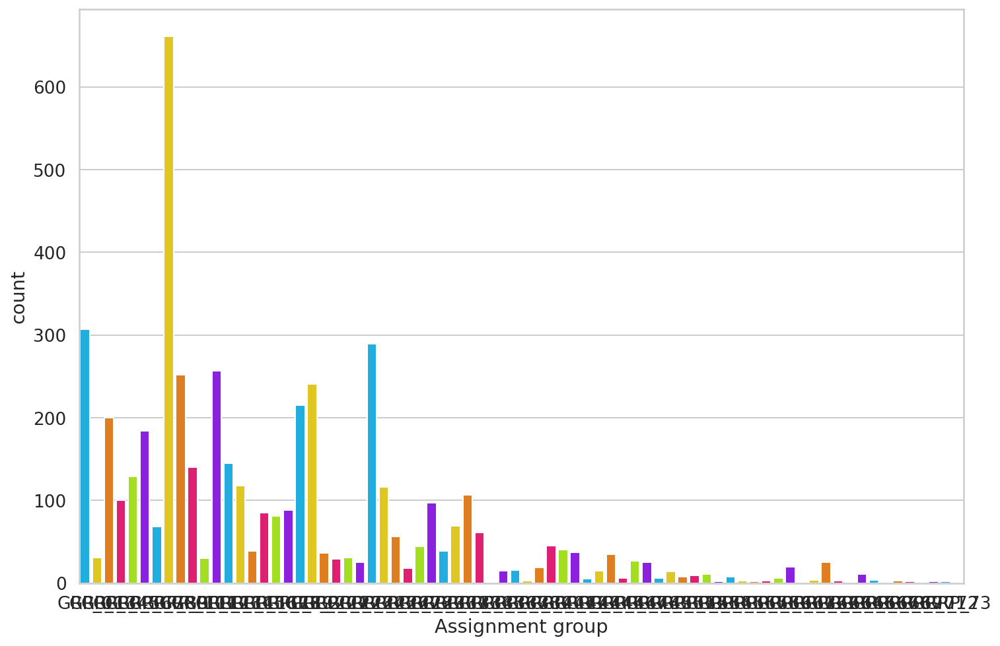

In [ ]:
chart = sns.countplot(inc_bert['Assignment group'], palette=HAPPY_COLORS_PALETTE)

We don't proceed with this bert model since there is lot of divergence and it is unable to form proper clusters. Instead we will directly process data through the bert embedding and classification model.

In [24]:
class TicketAssgnData:
  DATA_COLUMN = 'tokens'
  LABEL_COLUMN = 'class'

  def __init__(self, train, test, tokenizer: FullTokenizer, classes, max_seq_len=350):
    self.tokenizer = tokenizer
    self.max_seq_len = 0
    self.classes = classes

    ((self.train_x, self.train_y), (self.test_x, self.test_y)) = map(self._prepare, [train, test])

    self.max_seq_len = min(self.max_seq_len, max_seq_len)
    self.train_x, self.test_x = map(self._pad, [self.train_x, self.test_x])

  def _prepare(self, df):
    x, y = [], []

    for _, row in tqdm(df.iterrows()):
      text, label = row[TicketAssgnData.DATA_COLUMN], row[TicketAssgnData.LABEL_COLUMN]
      tokens = self.tokenizer.tokenize(text)
      tokens = ["[CLS]"] + tokens + ["[SEP]"]
      token_ids = self.tokenizer.convert_tokens_to_ids(tokens)
      self.max_seq_len = max(self.max_seq_len, len(token_ids))
      
      x.append(token_ids)
      y.append(self.classes.index(label))
    return np.array(x), np.array(y)

  def _pad(self, ids):
    x= []
    for input_ids in ids:
      cut_point = min(len(input_ids), self.max_seq_len - 2)
      input_ids = input_ids[:cut_point]
      
      input_ids = input_ids + [0] * (self.max_seq_len - len(input_ids))
      x.append(np.array(input_ids))
    return np.array(x)


In [33]:
tokenizer = FullTokenizer(vocab_file = os.path.join(bert_ckpt_dir, 'vocab.txt'))

In [34]:
def create_model(max_seq_len, bert_config_file, bert_ckpt_file):

  with tf.io.gfile.GFile(bert_config_file, 'r') as reader:
    bc = StockBertConfig.from_json_string(reader.read())
    bert_params = map_stock_config_to_params(bc)
    bert_params.adapter_size = None
    bert = BertModelLayer.from_params(bert_params, name='bert')

  input_ids = keras.layers.Input(shape=(max_seq_len,),dtype='int32',name='input_ids')
  bert_output = bert(input_ids)

  print('bert shape', bert_output.shape)
 
  cls_out = keras.layers.Lambda(lambda seq: seq[:, 0, :])(bert_output)
  cls_out = keras.layers.Dropout(0.5)(cls_out)
  logits = keras.layers.Dense(units=768, activation='tanh')(cls_out)
  logits = keras.layers.Dropout(0.5)(logits)
  logits = keras.layers.Dense(units=len(classes), activation='softmax')(logits)

  model = keras.Model(inputs=input_ids, outputs=logits)
  model.build(input_shape=(None, max_seq_len))

  load_stock_weights(bert, bert_ckpt_file)

  return model


In [35]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(incidents_cosine[['tokens','class']], test_size=0.25, random_state=10)

train.reset_index(drop=True,inplace=True)
test.reset_index(drop=True,inplace=True)

In [36]:
classes = train['class'].unique().tolist()

data = TicketAssgnData(train, test, tokenizer, classes, max_seq_len=350)

3157it [00:02, 1551.94it/s]
1053it [00:00, 1339.19it/s]


In [37]:
model = create_model(data.max_seq_len, bert_config_file, bert_ckpt_file)

bert shape (None, 350, 768)
Done loading 196 BERT weights from: model/uncased_L-12_H-768_A-12/bert_model.ckpt into <bert.model.BertModelLayer object at 0x7f2c712c7ef0> (prefix:bert). Count of weights not found in the checkpoint was: [0]. Count of weights with mismatched shape: [0]
Unused weights from checkpoint: 
	bert/embeddings/token_type_embeddings
	bert/pooler/dense/bias
	bert/pooler/dense/kernel
	cls/predictions/output_bias
	cls/predictions/transform/LayerNorm/beta
	cls/predictions/transform/LayerNorm/gamma
	cls/predictions/transform/dense/bias
	cls/predictions/transform/dense/kernel
	cls/seq_relationship/output_bias
	cls/seq_relationship/output_weights


In [38]:
data.train_x.shape

(3157, 350)

In [39]:
data.train_y[10]

0

In [40]:
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_ids (InputLayer)       [(None, 350)]             0         
_________________________________________________________________
bert (BertModelLayer)        (None, 350, 768)          108890112 
_________________________________________________________________
lambda (Lambda)              (None, 768)               0         
_________________________________________________________________
dropout (Dropout)            (None, 768)               0         
_________________________________________________________________
dense (Dense)                (None, 768)               590592    
_________________________________________________________________
dropout_1 (Dropout)          (None, 768)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)               

In [41]:
model.compile(
    optimizer=keras.optimizers.Adam(1e-5),
    loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name='acc')]
)

In [ ]:
log_dir = 'log/ticket_classif' + datetime.datetime.now().strftime("%Y%m%d-%H%M%s")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir)

history = model.fit(
    x=data.train_x,
    y=data.train_y,
    validation_split=0.1,
    batch_size=16,
    shuffle=True,
    epochs=5,
    callbacks=[tensorboard_callback]
)

Epoch 1/5
  1/178 [..............................] - ETA: 7s - loss: 2.3190 - acc: 0.0625

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir log

<IPython.core.display.Javascript object>

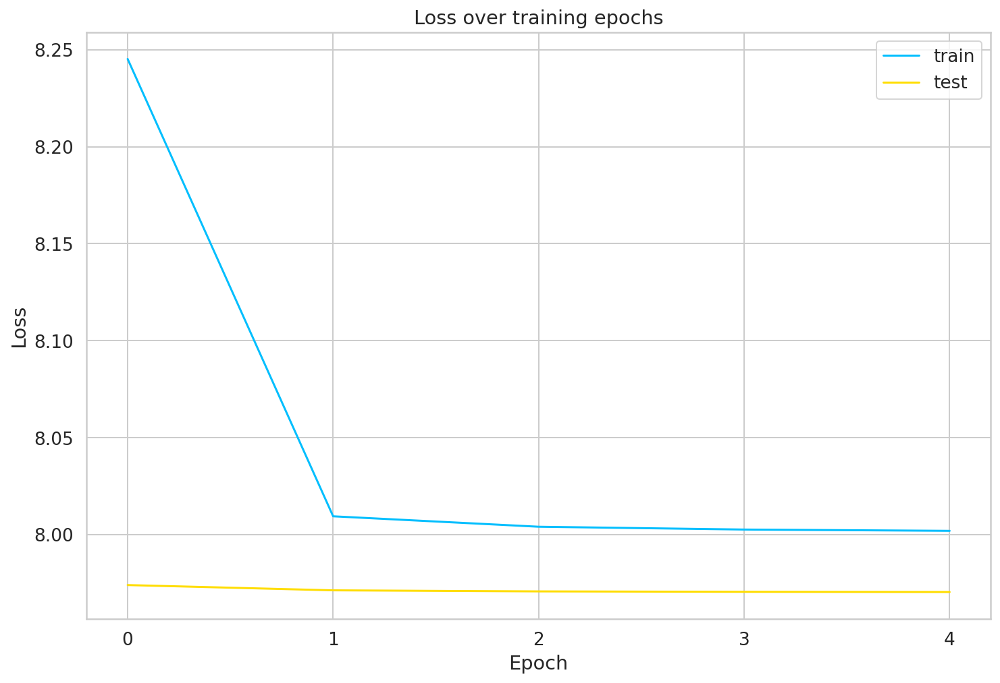

In [ ]:
ax = plt.figure().gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

ax.plot(history.history['loss'])
ax.plot(history.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'test'])
plt.title('Loss over training epochs')
plt.show();

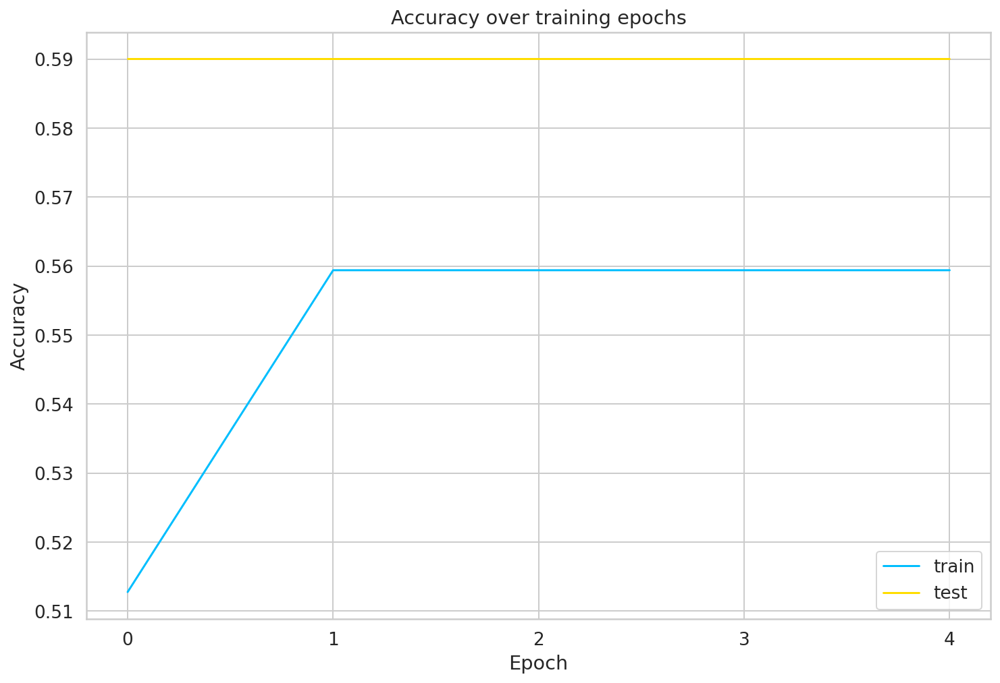

In [ ]:
ax = plt.figure().gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

ax.plot(history.history['acc'])
ax.plot(history.history['val_acc'])
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'test'])
plt.title('Accuracy over training epochs')
plt.show();

In [ ]:
_, train_acc = model.evaluate(data.train_x, data.train_y)
_, test_acc = model.evaluate(data.test_x, data.test_y)

print("train acc", train_acc)
print("test acc", test_acc)

55/55 [==============================] - 72s 1s/step - loss: 7.9909 - acc: 0.5695
train acc 0.5624760389328003
test acc 0.5695402026176453


In [ ]:
y_pred = model.predict(data.test_x).argmax(axis=1)

In [ ]:
res = " ".join([str(i) for i in classes])

In [ ]:
print(classification_report(data.test_y, y_pred, labels=classes))

              precision    recall  f1-score   support

        11.0       0.00      0.00      0.00        23
        21.0       0.00      0.00      0.00         0
        18.0       0.00      0.00      0.00         0
        28.0       0.00      0.00      0.00         0
        20.0       0.00      0.00      0.00         0
        25.0       0.00      0.00      0.00         0
        31.0       0.00      0.00      0.00         0
         8.0       0.00      0.00      0.00        23
        16.0       0.00      0.00      0.00         0
        29.0       0.00      0.00      0.00         0
        19.0       0.00      0.00      0.00         0
         3.0       0.00      0.00      0.00        47
         5.0       0.00      0.00      0.00        63
        26.0       0.00      0.00      0.00         0
        30.0       0.00      0.00      0.00         0

   micro avg       0.00      0.00      0.00       156
   macro avg       0.00      0.00      0.00       156
weighted avg       0.00   

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
cm = confusion_matrix(data.test_y, y_pred)
df_cm = pd.DataFrame(cm, index=classes, columns=classes)

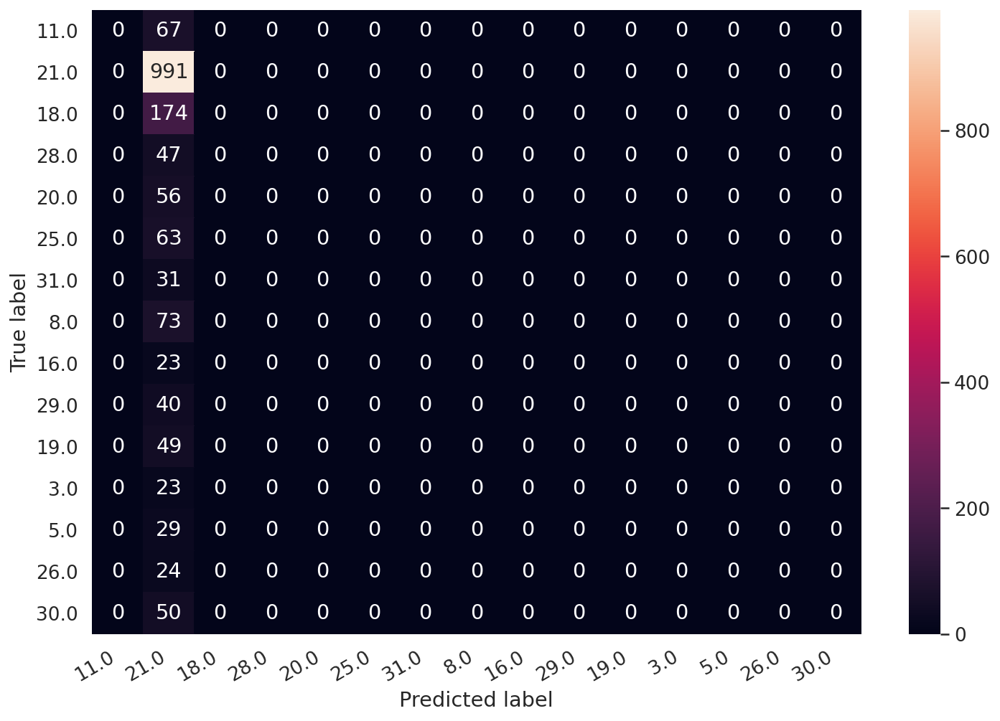

In [ ]:
hmap = sns.heatmap(df_cm, annot=True, fmt="d")
hmap.yaxis.set_ticklabels(hmap.yaxis.get_ticklabels(), rotation=0, ha='right')
hmap.xaxis.set_ticklabels(hmap.xaxis.get_ticklabels(), rotation=30, ha='right')
plt.ylabel('True label')
plt.xlabel('Predicted label');

In [ ]:
sentences = [
"verified user details employee manager name checked the user name in ad and reset the password advised the user to login and check caller confirmed that he was able to login issue resolved"
]

pred_tokens = map(tokenizer.tokenize, sentences)
pred_tokens = map(lambda tok: ["[CLS]"] + tok + ["[SEP]"], pred_tokens)
pred_token_ids = list(map(tokenizer.convert_tokens_to_ids, pred_tokens))

pred_token_ids = map(lambda tids: tids +[0]*(data.max_seq_len-len(tids)),pred_token_ids)
pred_token_ids = np.array(list(pred_token_ids))

predictions = model.predict(pred_token_ids).argmax(axis=-1)

for text, label in zip(sentences, predictions):
  print("ticket:", text, "\nassignment group:", classes[label])
  print()

ticket: verified user details employee manager name checked the user name in ad and reset the password advised the user to login and check caller confirmed that he was able to login issue resolved 
assignment group: 21.0



##BiDirectional LSTM for prediction

In [ ]:
incidents_clust['class'].unique()

array([0, 1, 3, 2, 7, 5, 6, 4, 9, 8])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(incidents_clust['tokens'].values, incidents_clust['class'].values, test_size=0.15, random_state=10)

In [ ]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(incidents['tokens'])

max_length = max([len(s.split()) for s in incidents['tokens']])

vocab_size = len(tokenizer.word_index) + 1

X_train_tokens = tokenizer.texts_to_sequences(X_train)
X_train_pad = pad_sequences(X_train_tokens,maxlen=300,padding='post')

X_test_tokens = tokenizer.texts_to_sequences(X_test)
X_test_pad = pad_sequences(X_test_tokens,maxlen=300,padding='post')

In [ ]:
X_train_pad.shape

(6752, 300)

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, 64, input_length=300),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

opt = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, decay=0.01)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.0001)
chckpoint = ModelCheckpoint(project_path, monitor='val_loss', verbose=0, save_best_only=False, save_weights_only=False, mode='auto', period=1)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
print(model.summary())


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 300, 64)           1341056   
_________________________________________________________________
bidirectional (Bidirectional (None, 128)               66048     
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 129       
Total params: 1,423,745
Trainable params: 1,423,745
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history = model.fit(X_train_pad, y_train, epochs=5, validation_split=0.2, batch_size=128, callbacks=[reduce_lr, chckpoint])

Epoch 1/5
43/43 [==============================] - 12s 279ms/step - loss: 1.7357e-07 - accuracy: 0.4390 - val_loss: 1.6580e-07 - val_accuracy: 0.5714
Epoch 2/5
43/43 [==============================] - 13s 294ms/step - loss: 1.7357e-07 - accuracy: 0.4318 - val_loss: 1.6580e-07 - val_accuracy: 0.5714
Epoch 3/5
43/43 [==============================] - 13s 298ms/step - loss: 1.7357e-07 - accuracy: 0.4377 - val_loss: 1.6580e-07 - val_accuracy: 0.5714
Epoch 4/5
43/43 [==============================] - 13s 300ms/step - loss: 1.7357e-07 - accuracy: 0.4358 - val_loss: 1.6580e-07 - val_accuracy: 0.5714
Epoch 5/5
43/43 [==============================] - 12s 290ms/step - loss: 1.7357e-07 - accuracy: 0.4371 - val_loss: 1.6580e-07 - val_accuracy: 0.5714


### A Simplied Interface to Text Classification With Hugging Face Transformers in TensorFlow Using [ktrain](https://github.com/amaiya/ktrain)


In [ ]:
incidents_smote_data.head()

In [ ]:
MODEL_NAME = 'distilbert-base-uncased'
t = text.Transformer(MODEL_NAME, maxlen=500, classes=incidents_clust['class'].unique().tolist())
trn = t.preprocess_train(X_train, y_train)
val = t.preprocess_test(X_test, y_test)
model = t.get_classifier()
learner = ktrain.get_learner(model, train_data=trn, val_data=val, batch_size=6)

/usr/local/lib/python3.6/dist-packages/ktrain/text/preprocessor.py:380: UserWarning: The class_names argument is replacing the classes argument. Please update your code.
  warnings.warn('The class_names argument is replacing the classes argument. Please update your code.')


preprocessing train...
language: en
train sequence lengths:
	mean : 36
	95percentile : 129
	99percentile : 212


Is Multi-Label? False
preprocessing test...
language: en
test sequence lengths:
	mean : 31
	95percentile : 97
	99percentile : 158


Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing TFDistilBertForSequenceClassification: ['vocab_transform', 'vocab_layer_norm', 'activation_13', 'vocab_projector']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPretraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of TFDistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['pre_classifier', 'classifier', 'dropout_100']
You should probably TRAIN this model on a down-stream task to be able to use 

simulating training for different learning rates... this may take a few moments...
Epoch 1/3
590/590 [==============================] - 222s 377ms/step - loss: 2.0099 - accuracy: 0.3229
Epoch 2/3
590/590 [==============================] - 222s 377ms/step - loss: 2.0023 - accuracy: 0.2814
Epoch 3/3
590/590 [==============================] - 218s 369ms/step - loss: 2.6156 - accuracy: 0.1943


Some weights of the model checkpoint at /tmp/tmps4t49rvg were not used when initializing TFDistilBertForSequenceClassification: ['dropout_40']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPretraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of TFDistilBertForSequenceClassification were not initialized from the model checkpoint at /tmp/tmps4t49rvg and are newly initialized: ['dropout_60']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.




done.
Visually inspect loss plot and select learning rate associated with falling loss


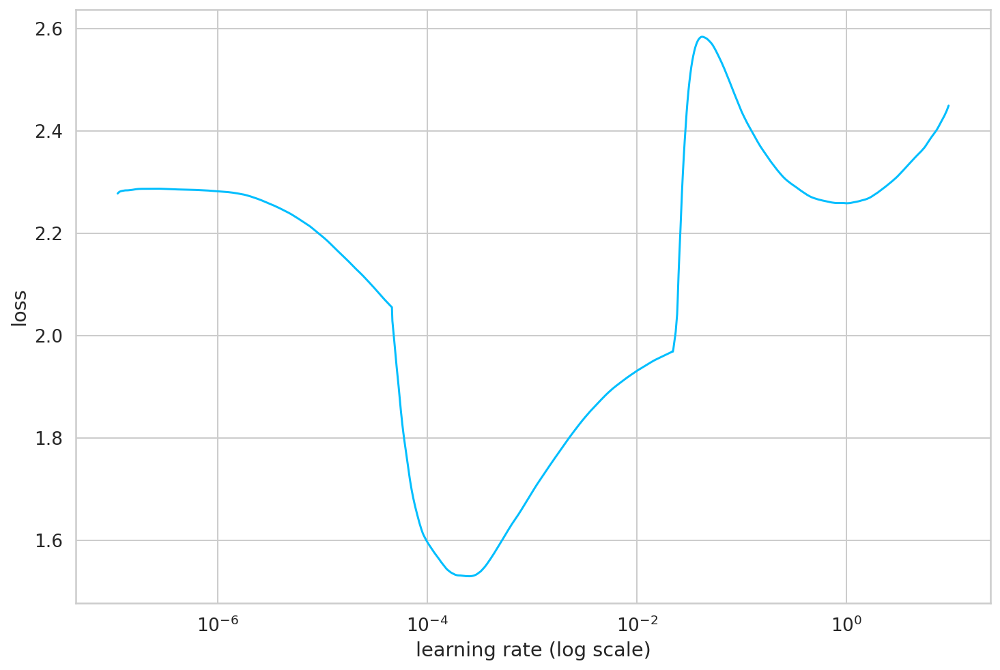

In [ ]:
learner.lr_find(show_plot=True, max_epochs=3)

In [ ]:
learner.fit_onecycle(6e-5, 7)



begin training using onecycle policy with max lr of 6e-05...
Epoch 1/7
591/591 [==============================] - 237s 401ms/step - loss: 1.6476 - accuracy: 0.4650 - val_loss: 1.3055 - val_accuracy: 0.5559
Epoch 2/7
591/591 [==============================] - 236s 399ms/step - loss: 1.1373 - accuracy: 0.6174 - val_loss: 1.0620 - val_accuracy: 0.6502
Epoch 3/7
591/591 [==============================] - 236s 399ms/step - loss: 0.7621 - accuracy: 0.7580 - val_loss: 1.0234 - val_accuracy: 0.6757
Epoch 4/7
591/591 [==============================] - 236s 399ms/step - loss: 0.5407 - accuracy: 0.8255 - val_loss: 1.0414 - val_accuracy: 0.6725
Epoch 5/7
591/591 [==============================] - 236s 399ms/step - loss: 0.3034 - accuracy: 0.9085 - val_loss: 1.0479 - val_accuracy: 0.7460
Epoch 6/7
591/591 [==============================] - 236s 399ms/step - loss: 0.1639 - accuracy: 0.9500 - val_loss: 1.1174 - val_accuracy: 0.7284
Epoch 7/7
591/591 [==============================] - 236s 399ms/ste

In [ ]:
learner.validate(class_names=t.get_classes())

In [ ]:
learner.view_top_losses(n=1, preproc=t)

In [ ]:
predictor = ktrain.get_predictor(learner.model, preproc=t)